# P09 - Analysez les saisonnalités des ventes d'une activité e-commerce pour gérer au mieux les variations d'activité

## 1/ Explorez le jeu de données

### 1.1 Chargez les données

In [5]:
# importation librairies

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import scipy.stats as st
import plotly.express as px

In [6]:
#import fichier excel

df_fa = pd.read_excel('Jeu_données_fastalim.xlsx')

### 1.2 Déterminez les ordres de grandeurs et indicateurs statistiques basiques

### Affichez les premièrs et dernières lignes du jeu de données

In [9]:
display (df_fa)

,date,product,sales
0,2017-01-01,tomate,121.629409
1,2017-01-02,tomate,118.254860
2,2017-01-03,tomate,115.894564
3,2017-01-04,tomate,112.591428
4,2017-01-05,tomate,105.016703
...,...,...,...
32860,2022-12-27,mangue,44.855785
32861,2022-12-28,mangue,39.626589
32862,2022-12-29,mangue,42.041256
32863,2022-12-30,mangue,43.909817


### Déterminez la structure du jeu de données

In [11]:
#structure du fichier

df_fa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32865 entries, 0 to 32864
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   date     32865 non-null  datetime64[ns]
 1   product  32865 non-null  object        
 2   sales    32865 non-null  float64       
dtypes: datetime64[ns](1), float64(1), object(1)
memory usage: 770.4+ KB


il n'y a pas de valeurs nulles dans le fichier et les variables ont été importées dans le bon type

### Traitez les valeurs manquantes

In [14]:
#recherche valeurs manquantes

df_fa.isnull().sum()

date       0
product    0
sales      0
dtype: int64

In [15]:
#il n'y a pas de valeurs manquantes

### Calculez des indicateurs statistiques

In [17]:
#structure de la data

df_fa.describe()

,date,sales
count,32865,32865.000000
mean,2020-01-01 00:00:00,97.117858
min,2017-01-01 00:00:00,-3.789978
25%,2018-07-02 00:00:00,69.905156
50%,2020-01-01 00:00:00,91.853413
75%,2021-07-02 00:00:00,122.164007
max,2022-12-31 00:00:00,228.911753
std,NaN,37.534356


In [18]:
std_df_fa = df_fa['sales'].std()
print(std_df_fa)

37.53435603497219


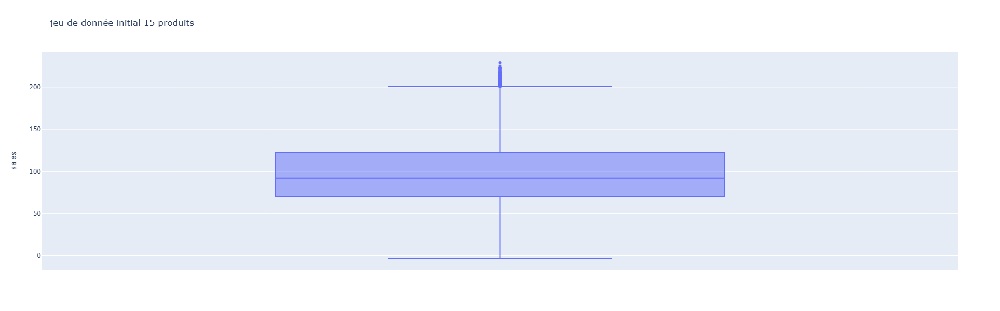

In [19]:
# Crée un boxplot pour le describe
fig = px.box(df_fa, y="sales", title="jeu de donnée initial 15 produits", width=500, height=600)
fig.show()

si page  traduite en fancais
mst= ecart type
50% = médianne
méchant = moyenne

le jeu de données se base sur 6 années de ventes, il y a une vente au minimum qui est en négatif (min=-3)

### Les produits

In [23]:
#valeurs distinctes variable product

df_fa["product"].unique()


array(['tomate', 'pomme', 'banane', 'abricot', 'kiwi', 'pasteque',
       'ananas', 'peche', 'orange', 'melon', 'poire', 'clementine',
       'cerise', 'pamplemousse', 'mangue'], dtype=object)

In [24]:
#nombre de produits 

print("il y a {} produits différents dans le jeu de donnée".format(len(df_fa["product"].unique())))

il y a 15 produits différents dans le jeu de donnée


nous avons bien que des fruits et légumes en produit comme demandé dans l'analyse

## 1.3 Préparez le jeu de données pour l'analyse

#### recherche de doublons

In [28]:
# le fichier rassemble les quantités vendues par produit par date,
#il ne peut pas y avoir de doublons sur les deux colonnes date et produit

df_fa.loc[df_fa[["date", "product"]].duplicated(keep=False),:]

,date,product,sales


il n'y a pas de doublons

#### outliers

In [31]:
# nous avons vu qu'il y avait au moins une vente en négatif
# nous allons regarder si il y a d'autres ventes en négatif et les mettre en conformité donc en positif

df_fa.loc[df_fa['sales'] < 0, 'sales']

17995   -0.382452
28596   -3.789978
Name: sales, dtype: float64

In [32]:
#correction en valeurs absolues

df_fa.loc[df_fa['sales'] < 0, 'sales'] = abs(df_fa.loc[df_fa['sales'] < 0, 'sales'])

In [33]:
#Vérification
print(df_fa.loc[[17995, 28596]])

            date       product     sales
17995 2018-04-13        orange  0.382452
28596 2017-04-24  pamplemousse  3.789978


il n'y a pas de colonnes avec des calculs que nous aurions à vérifier et re-calculer

le jeu de données semble à présent propre, on peut avancer sur la partie analyse

### export fichier excel nettoyé

In [36]:
chemin_fichier_excel = 'C:\\Grégoire\\Formation_Supply_chain_analyst\\Projet 9 - analyse_pics_vente_gérer_variations_activité\\2_données_travaillées\\données_fa_nettoyees.xlsx'
df_fa.to_excel(chemin_fichier_excel, index=False)



# 2/ Analysez les saisonnalités du top 5 des produits et les corrélations

## 2.1 Visualisez les données

### Les ventes



### ventes sur 6 ans

In [41]:
# total ventes sur la période

total_ventes = df_fa['sales'].sum()

print(total_ventes)

3191786.739858863


### ventes par année

In [43]:
#total ventes par année (methode dt.year module datetimes pandas)

df_fa["annee"] = df_fa["date"].dt.year

ventes_par_an = df_fa.groupby("annee")["sales"].sum()
print(ventes_par_an)

annee
2017    521942.527131
2018    526121.416597
2019    529662.762712
2020    532656.949000
2021    539035.508396
2022    542367.576022
Name: sales, dtype: float64


### ventes par produit

In [45]:
#total vente période par produit

total_ventes_par_produit = df_fa.groupby('product')['sales'].sum()

total_ventes_par_produit = total_ventes_par_produit.sort_values(ascending=False)

print(total_ventes_par_produit)

product
tomate          344699.890092
pomme           332199.554121
banane          283751.424769
abricot         268172.010859
kiwi            257409.955715
pasteque        206061.790719
ananas          199916.078989
peche           193510.879571
orange          189814.441949
melon           178214.697175
clementine      168339.394867
poire           167489.149435
cerise          156641.506399
pamplemousse    151162.570277
mangue           94403.394921
Name: sales, dtype: float64


## 2.2 Sélectionnez le top 5

In [47]:
#top 5 sur 6 ans

top_5_produits = total_ventes_par_produit.head(5)
print(top_5_produits)

product
tomate     344699.890092
pomme      332199.554121
banane     283751.424769
abricot    268172.010859
kiwi       257409.955715
Name: sales, dtype: float64


## 2.3 Calcul et Analyse les ventes annuelles par produit

### ventes annuelles top 5 

In [50]:
#ventes annuelles des top 5
liste_top_5 = top_5_produits.index
df_top_5 = df_fa[df_fa['product'].isin(liste_top_5)].copy()
ventes_année_produit = df_top_5.groupby(['product', df_top_5['date'].dt.year])['sales'].sum()
print(ventes_année_produit)

product  date
abricot  2017    44831.060565
         2018    44577.072596
         2019    44899.938757
         2020    44878.135424
         2021    44599.319530
         2022    44386.483987
banane   2017    48233.269212
         2018    47282.849224
         2019    46891.231939
         2020    47481.644020
         2021    46911.884818
         2022    46950.545556
kiwi     2017    42748.463807
         2018    43524.866486
         2019    42444.064781
         2020    42874.738564
         2021    42863.191010
         2022    42954.631066
pomme    2017    52777.258194
         2018    53971.059818
         2019    54465.614811
         2020    55673.797519
         2021    57576.894477
         2022    57734.929303
tomate   2017    52113.484333
         2018    54381.275174
         2019    56575.572140
         2020    58553.414693
         2021    60410.919532
         2022    62665.224219
Name: sales, dtype: float64


In [51]:
#création d'un tableau ventes annuelles top5 grace à la liste de résultat top 5 par an
ventes_année_produit2 = df_top_5.groupby(['product', df_top_5['date'].dt.year])['sales'].sum().reset_index()
tableau_top5an = pd.pivot_table(ventes_année_produit2, values='sales', index='product', columns='date')
print(tableau_top5an)

date             2017          2018          2019          2020          2021  \
product                                                                         
abricot  44831.060565  44577.072596  44899.938757  44878.135424  44599.319530   
banane   48233.269212  47282.849224  46891.231939  47481.644020  46911.884818   
kiwi     42748.463807  43524.866486  42444.064781  42874.738564  42863.191010   
pomme    52777.258194  53971.059818  54465.614811  55673.797519  57576.894477   
tomate   52113.484333  54381.275174  56575.572140  58553.414693  60410.919532   

date             2022  
product                
abricot  44386.483987  
banane   46950.545556  
kiwi     42954.631066  
pomme    57734.929303  
tomate   62665.224219  


In [52]:
#enregistrement de la série en dataframe

#sinon pour faire les graphiques sur des séries, c'est plus complexe, la série est un panda multi-index (product+date) c'est à dire que la 1ere colonne comprend deux entrées: product + date,
#necessite utilisation index.levels[0] et index pour trouver les valeurs produits et années sinon
#et pas de nom sur la colonne sales: necessite utilsation .values dans du code
#donc plus simple d'avoir un dataframe


ventes_année_produit_df = ventes_année_produit.reset_index()

# Renommer les colonnes
ventes_année_produit_df.columns = ['product', 'date', 'sales']

# Afficher pour vérifier
print(ventes_année_produit_df)

    product  date         sales
0   abricot  2017  44831.060565
1   abricot  2018  44577.072596
2   abricot  2019  44899.938757
3   abricot  2020  44878.135424
4   abricot  2021  44599.319530
5   abricot  2022  44386.483987
6    banane  2017  48233.269212
7    banane  2018  47282.849224
8    banane  2019  46891.231939
9    banane  2020  47481.644020
10   banane  2021  46911.884818
11   banane  2022  46950.545556
12     kiwi  2017  42748.463807
13     kiwi  2018  43524.866486
14     kiwi  2019  42444.064781
15     kiwi  2020  42874.738564
16     kiwi  2021  42863.191010
17     kiwi  2022  42954.631066
18    pomme  2017  52777.258194
19    pomme  2018  53971.059818
20    pomme  2019  54465.614811
21    pomme  2020  55673.797519
22    pomme  2021  57576.894477
23    pomme  2022  57734.929303
24   tomate  2017  52113.484333
25   tomate  2018  54381.275174
26   tomate  2019  56575.572140
27   tomate  2020  58553.414693
28   tomate  2021  60410.919532
29   tomate  2022  62665.224219


In [53]:
df_top_5.info()

<class 'pandas.core.frame.DataFrame'>
Index: 10955 entries, 0 to 10954
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   date     10955 non-null  datetime64[ns]
 1   product  10955 non-null  object        
 2   sales    10955 non-null  float64       
 3   annee    10955 non-null  int32         
dtypes: datetime64[ns](1), float64(1), int32(1), object(1)
memory usage: 385.1+ KB


In [54]:
#describe df_top_5

df_top_5.describe()

,date,sales,annee
count,10955,10955.000000,10955.000000
mean,2020-01-01 00:00:00,135.667078,2019.500228
min,2017-01-01 00:00:00,57.045727,2017.000000
25%,2018-07-02 00:00:00,115.752818,2018.000000
50%,2020-01-01 00:00:00,134.451059,2020.000000
75%,2021-07-02 00:00:00,154.244158,2021.000000
max,2022-12-31 00:00:00,228.911753,2022.000000
std,NaN,28.164064,1.707547


In [415]:
std_df_top_5 = df_top_5['sales'].std()
print(std_df_top_5)

28.16406360747235


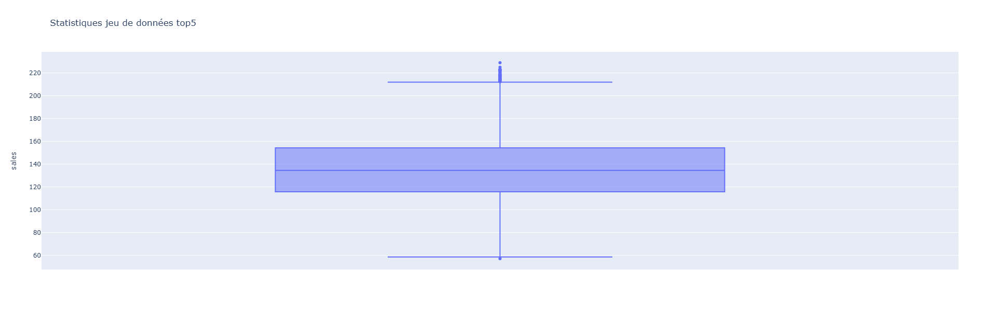

In [56]:
# Crée un boxplot pour le describe top5
fig = px.box(df_top_5, y="sales", title="Statistiques jeu de données top5", width=500, height=600)
fig.show()

### moyennes/jour annuelles top 5 

In [58]:
#moyenne/jour annuelles top 5
df_top_5['année'] = df_top_5['date'].dt.year
moyennes_années_produit = df_top_5.groupby(['product', 'année'])['sales'].mean()
print(moyennes_années_produit)

product  année
abricot  2017     122.824823
         2018     122.128966
         2019     123.013531
         2020     122.617856
         2021     122.189917
         2022     121.606805
banane   2017     132.145943
         2018     129.542053
         2019     128.469129
         2020     129.731268
         2021     128.525712
         2022     128.631632
kiwi     2017     117.119079
         2018     119.246210
         2019     116.285109
         2020     117.144094
         2021     117.433400
         2022     117.683921
pomme    2017     144.595228
         2018     147.865917
         2019     149.220862
         2020     152.114201
         2021     157.744916
         2022     158.177889
tomate   2017     142.776669
         2018     148.989795
         2019     155.001568
         2020     159.982007
         2021     165.509369
         2022     171.685546
Name: sales, dtype: float64


In [59]:
#création tableau moyenne/jour annuelle top 5
moyennes_annuelles = df_top_5.groupby(['product', 'année'])['sales'].mean().reset_index()
tableau_top5annee = pd.pivot_table(moyennes_annuelles, values='sales', index='product', columns='année')
print(tableau_top5annee)

année          2017        2018        2019        2020        2021  \
product                                                               
abricot  122.824823  122.128966  123.013531  122.617856  122.189917   
banane   132.145943  129.542053  128.469129  129.731268  128.525712   
kiwi     117.119079  119.246210  116.285109  117.144094  117.433400   
pomme    144.595228  147.865917  149.220862  152.114201  157.744916   
tomate   142.776669  148.989795  155.001568  159.982007  165.509369   

année          2022  
product              
abricot  121.606805  
banane   128.631632  
kiwi     117.683921  
pomme    158.177889  
tomate   171.685546  


In [60]:
#enregistrement de la série en dataframe
moyennes_années_produit_df = moyennes_années_produit.reset_index()

# Renommer les colonnes
moyennes_années_produit_df.columns = ['product', 'date', 'moyenne']

# Afficher pour vérifier
print(moyennes_années_produit_df)

    product  date     moyenne
0   abricot  2017  122.824823
1   abricot  2018  122.128966
2   abricot  2019  123.013531
3   abricot  2020  122.617856
4   abricot  2021  122.189917
5   abricot  2022  121.606805
6    banane  2017  132.145943
7    banane  2018  129.542053
8    banane  2019  128.469129
9    banane  2020  129.731268
10   banane  2021  128.525712
11   banane  2022  128.631632
12     kiwi  2017  117.119079
13     kiwi  2018  119.246210
14     kiwi  2019  116.285109
15     kiwi  2020  117.144094
16     kiwi  2021  117.433400
17     kiwi  2022  117.683921
18    pomme  2017  144.595228
19    pomme  2018  147.865917
20    pomme  2019  149.220862
21    pomme  2020  152.114201
22    pomme  2021  157.744916
23    pomme  2022  158.177889
24   tomate  2017  142.776669
25   tomate  2018  148.989795
26   tomate  2019  155.001568
27   tomate  2020  159.982007
28   tomate  2021  165.509369
29   tomate  2022  171.685546


## 2.4 Calcul et analyse les ventes mensuelles par produit

#### ventes mensuelles top 5 

In [63]:
#création de colonnse année, mois, année_mois pour distinguer tous les éléments directement sur les 6 années

df_top_5['mois'] = df_top_5['date'].dt.month
df_top_5['année_mois'] = df_top_5['année'].astype(str) + '-' + df_top_5['mois'].astype(str).str.zfill(2)
ventes_année_mois_produit = df_top_5.groupby(['product', 'année_mois'])['sales'].sum()
print(ventes_année_mois_produit)



product  année_mois
abricot  2017-01       3226.954736
         2017-02       3122.462030
         2017-03       3752.885201
         2017-04       3963.676572
         2017-05       4449.829873
                          ...     
tomate   2022-08       6058.440002
         2022-09       5484.128973
         2022-10       4946.720347
         2022-11       4500.879982
         2022-12       4372.453757
Name: sales, Length: 360, dtype: float64


In [64]:
#création d'un tableau top5 par mois 

ventes_année_mois_produit2 = df_top_5.groupby(['product', 'année_mois'])['sales'].sum().reset_index()
tableau_top5mois = pd.pivot_table(ventes_année_mois_produit2, values='sales', index='product', columns='année_mois')
print(tableau_top5mois)

année_mois      2017-01      2017-02      2017-03      2017-04      2017-05  \
product                                                                       
abricot     3226.954736  3122.462030  3752.885201  3963.676572  4449.829873   
banane      4102.591801  3847.812988  4083.224221  4070.972763  4021.717530   
kiwi        4131.922951  3547.784001  3538.512036  3212.314626  2888.619349   
pomme       4516.455635  3801.684647  4478.416039  4341.174341  4559.764339   
tomate      3657.701067  3666.634426  4513.374896  4672.516892  5168.426587   

année_mois      2017-06      2017-07      2017-08      2017-09      2017-10  \
product                                                                       
abricot     4625.332815  4416.948593  3934.631410  3518.663307  3391.953090   
banane      3906.504165  4079.054920  3978.299879  4011.253849  4027.039857   
kiwi        2831.255317  3040.897856  3307.201872  3590.543276  4144.530414   
pomme       4375.884458  4661.612037  4367.080616  

In [65]:
#enregistrement de la série en dataframe
ventes_année_mois_produit_df = ventes_année_mois_produit.reset_index()

# Renommer les colonnes
ventes_année_mois_produit_df.columns = ['product', 'date', 'sales']

# Afficher pour vérifier
print(ventes_année_mois_produit_df)

     product     date        sales
0    abricot  2017-01  3226.954736
1    abricot  2017-02  3122.462030
2    abricot  2017-03  3752.885201
3    abricot  2017-04  3963.676572
4    abricot  2017-05  4449.829873
..       ...      ...          ...
355   tomate  2022-08  6058.440002
356   tomate  2022-09  5484.128973
357   tomate  2022-10  4946.720347
358   tomate  2022-11  4500.879982
359   tomate  2022-12  4372.453757

[360 rows x 3 columns]


### moyennes/jour par mois top 5 

In [67]:
moyennes_mois_produit= df_top_5.groupby(['product', 'année_mois'])['sales'].mean()
print(moyennes_mois_produit)

product  année_mois
abricot  2017-01       104.095314
         2017-02       111.516501
         2017-03       121.060813
         2017-04       132.122552
         2017-05       143.542899
                          ...    
tomate   2022-08       195.433548
         2022-09       182.804299
         2022-10       159.571624
         2022-11       150.029333
         2022-12       141.046895
Name: sales, Length: 360, dtype: float64


In [68]:
#création tableau moyennes/jour mensuelles top5

moyennes_mensuelles = df_top_5.groupby(['product', 'année_mois'])['sales'].mean().reset_index()
tableau_moyennes_jour_mensuelles_top5mois = pd.pivot_table(moyennes_mensuelles, values='sales', index='product', columns='année_mois')
print(tableau_moyennes_jour_mensuelles_top5mois)

année_mois     2017-01     2017-02     2017-03     2017-04     2017-05  \
product                                                                  
abricot     104.095314  111.516501  121.060813  132.122552  143.542899   
banane      132.341671  137.421892  131.716910  135.699092  129.732824   
kiwi        133.287837  126.706571  114.145550  107.077154   93.181269   
pomme       145.692117  135.774452  144.465034  144.705811  147.089172   
tomate      117.990357  130.951229  145.592739  155.750563  166.723438   

année_mois     2017-06     2017-07     2017-08     2017-09     2017-10  ...  \
product                                                                 ...   
abricot     154.177761  142.482213  126.923594  117.288777  109.417842  ...   
banane      130.216805  131.582417  128.332254  133.708462  129.904512  ...   
kiwi         94.375177   98.093479  106.683931  119.684776  133.694529  ...   
pomme       145.862815  150.374582  140.873568  145.506230  146.109214  ...   
tomate 

In [69]:
#enregistrement de la série en dataframe
moyennes_mois_produit_df = moyennes_mois_produit.reset_index()

# Renommer les colonnes
moyennes_mois_produit_df.columns = ['product', 'date', 'moyenne']

# Afficher pour vérifier
print(moyennes_mois_produit_df)

     product     date     moyenne
0    abricot  2017-01  104.095314
1    abricot  2017-02  111.516501
2    abricot  2017-03  121.060813
3    abricot  2017-04  132.122552
4    abricot  2017-05  143.542899
..       ...      ...         ...
355   tomate  2022-08  195.433548
356   tomate  2022-09  182.804299
357   tomate  2022-10  159.571624
358   tomate  2022-11  150.029333
359   tomate  2022-12  141.046895

[360 rows x 3 columns]


## 2.5 Calcul moyennes mobiles

### moyennes mobiles journalieres

In [72]:
df_top_5['sales_mm'] = df_top_5['sales'].rolling(window=15).mean()
df_top_5

,date,product,sales,annee,année,mois,année_mois,sales_mm
0,2017-01-01,tomate,121.629409,2017,2017,1,2017-01,NaN
1,2017-01-02,tomate,118.254860,2017,2017,1,2017-01,NaN
2,2017-01-03,tomate,115.894564,2017,2017,1,2017-01,NaN
3,2017-01-04,tomate,112.591428,2017,2017,1,2017-01,NaN
4,2017-01-05,tomate,105.016703,2017,2017,1,2017-01,NaN
...,...,...,...,...,...,...,...,...
10950,2022-12-27,kiwi,146.748839,2022,2022,12,2022-12,144.995249
10951,2022-12-28,kiwi,118.879370,2022,2022,12,2022-12,143.154661
10952,2022-12-29,kiwi,146.796827,2022,2022,12,2022-12,140.807835
10953,2022-12-30,kiwi,182.893373,2022,2022,12,2022-12,145.312436


### moyennes mobiles par mois

In [74]:
moyennes_mois_mobiles_produit = df_top_5.groupby(['product', 'année_mois'])['sales_mm'].mean()
print(moyennes_mois_mobiles_produit)

product  année_mois
abricot  2017-01       109.586545
         2017-02       108.251968
         2017-03       119.105884
         2017-04       129.006766
         2017-05       141.913455
                          ...    
tomate   2022-08       198.492087
         2022-09       184.929852
         2022-10       165.406209
         2022-11       151.553654
         2022-12       142.139896
Name: sales_mm, Length: 360, dtype: float64


In [75]:
#enregistrement de la série en dataframe
moyennes_mois_mobiles_produit_df = moyennes_mois_mobiles_produit.reset_index()

# Renommer les colonnes
moyennes_mois_mobiles_produit_df.columns = ['product', 'date', 'moyenne_mobile']

# Afficher pour vérifier
print(moyennes_mois_mobiles_produit_df)

     product     date  moyenne_mobile
0    abricot  2017-01      109.586545
1    abricot  2017-02      108.251968
2    abricot  2017-03      119.105884
3    abricot  2017-04      129.006766
4    abricot  2017-05      141.913455
..       ...      ...             ...
355   tomate  2022-08      198.492087
356   tomate  2022-09      184.929852
357   tomate  2022-10      165.406209
358   tomate  2022-11      151.553654
359   tomate  2022-12      142.139896

[360 rows x 3 columns]


### moyennes mobiles par année

In [77]:
moyennes_mobiles_année = df_top_5.groupby(['product', 'année'])['sales_mm'].mean()
print(moyennes_mobiles_année)

product  année
abricot  2017     123.148229
         2018     122.423306
         2019     123.064245
         2020     122.514299
         2021     122.232410
         2022     121.668972
banane   2017     132.716916
         2018     129.570840
         2019     128.643237
         2020     129.620520
         2021     128.502325
         2022     128.614779
kiwi     2017     116.504215
         2018     118.829123
         2019     116.637347
         2020     117.086162
         2021     117.286621
         2022     117.655278
pomme    2017     144.685949
         2018     147.474634
         2019     149.515452
         2020     151.874184
         2021     157.579011
         2022     158.190930
tomate   2017     143.837820
         2018     148.929974
         2019     154.898373
         2020     159.919607
         2021     165.464081
         2022     171.519430
Name: sales_mm, dtype: float64


In [78]:
#enregistrement de la série en dataframe
moyennes_mobiles_année_df = moyennes_mobiles_année.reset_index()

# Renommer les colonnes
moyennes_mobiles_année_df.columns = ['product', 'date', 'moyenne_mobile']

# Afficher pour vérifier
print(moyennes_mobiles_année_df)

    product  date  moyenne_mobile
0   abricot  2017      123.148229
1   abricot  2018      122.423306
2   abricot  2019      123.064245
3   abricot  2020      122.514299
4   abricot  2021      122.232410
5   abricot  2022      121.668972
6    banane  2017      132.716916
7    banane  2018      129.570840
8    banane  2019      128.643237
9    banane  2020      129.620520
10   banane  2021      128.502325
11   banane  2022      128.614779
12     kiwi  2017      116.504215
13     kiwi  2018      118.829123
14     kiwi  2019      116.637347
15     kiwi  2020      117.086162
16     kiwi  2021      117.286621
17     kiwi  2022      117.655278
18    pomme  2017      144.685949
19    pomme  2018      147.474634
20    pomme  2019      149.515452
21    pomme  2020      151.874184
22    pomme  2021      157.579011
23    pomme  2022      158.190930
24   tomate  2017      143.837820
25   tomate  2018      148.929974
26   tomate  2019      154.898373
27   tomate  2020      159.919607
28   tomate  2

# 3 Analyses individuelles des produits du top 5 

## 3.1 analyse tomate

### analyse volumes sur période

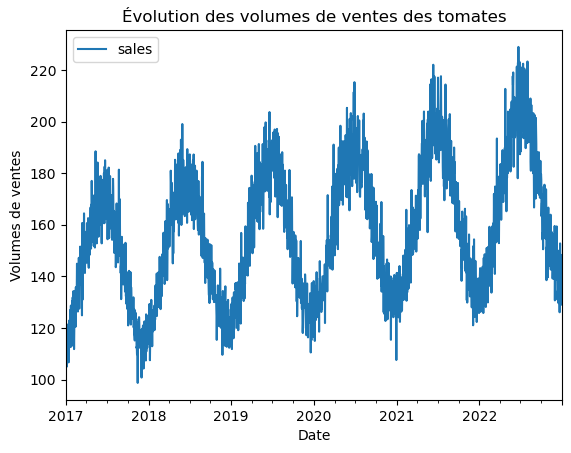

In [82]:
tomate = df_top_5.loc[df_top_5['product'] == 'tomate']
tomate.plot(x='date', y='sales')
plt.title("Évolution des volumes de ventes des tomates")
plt.xlabel("Date")
plt.ylabel("Volumes de ventes")
plt.show()

il y a de fortes variations constantes qui se dégagent

### analyse volumes mensuels

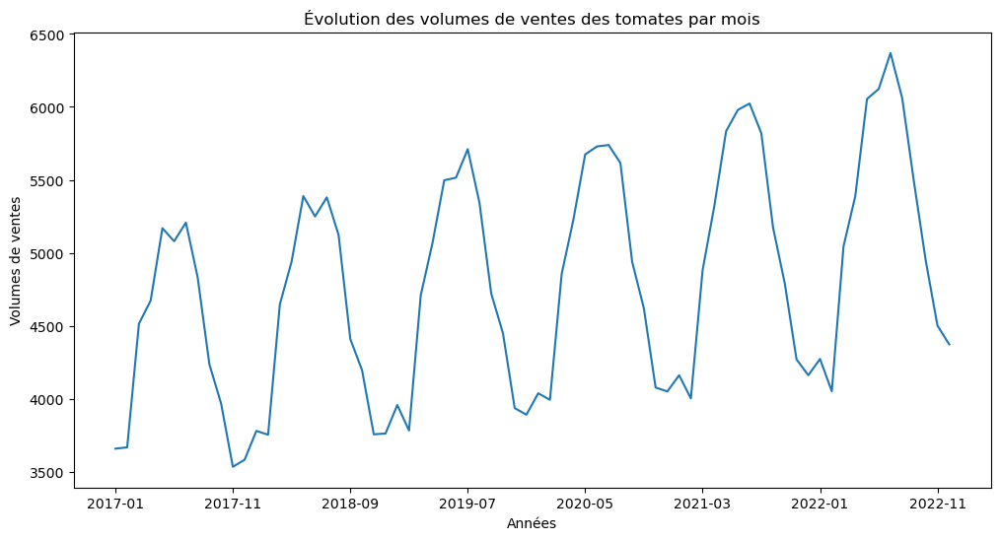

In [85]:
tomates2 = ventes_année_mois_produit.loc['tomate']
tomates2.plot(x='date', y='sales', figsize =(12,6))
plt.title("Évolution des volumes de ventes des tomates par mois")
plt.xlabel("Années")
plt.ylabel("Volumes de ventes")
plt.show()

In [86]:
# il y a des pics de ventes durant les étés et ensuite les volumes diminuent de façon assez linéaire

### analyse volumes annuels

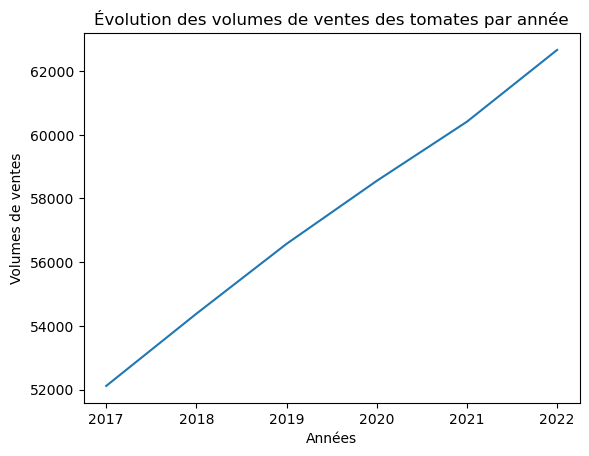

In [88]:
tomates3 = ventes_année_produit.loc['tomate']
tomates3.plot(x='date', y='sales')
plt.title("Évolution des volumes de ventes des tomates par année")
plt.xlabel("Années")
plt.ylabel("Volumes de ventes")
plt.show()

l'évolution des volumes de manière globale augmente de façon linéaire

# analyse moyennes mensuelles

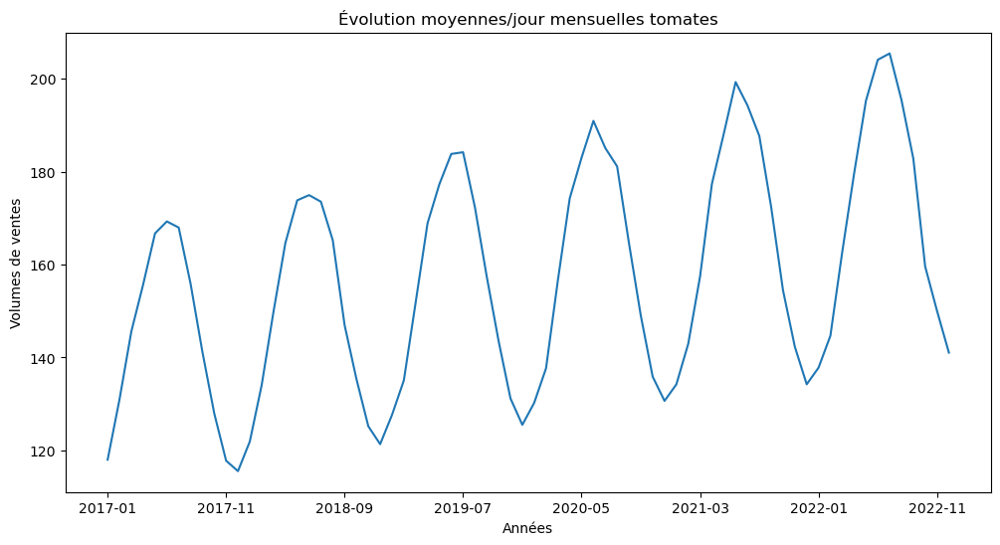

In [91]:
tomates4 = moyennes_mois_produit.loc['tomate']
tomates4.plot(x='date', y='sales', figsize =(12,6))
plt.title("Évolution moyennes/jour mensuelles tomates")
plt.xlabel("Années")
plt.ylabel("Volumes de ventes")
plt.show()

In [92]:
#les moyennes par jour mensuelles nous font mieux ressortir les types de variations qu'il existe par mois

# analyse moyennes annuelles

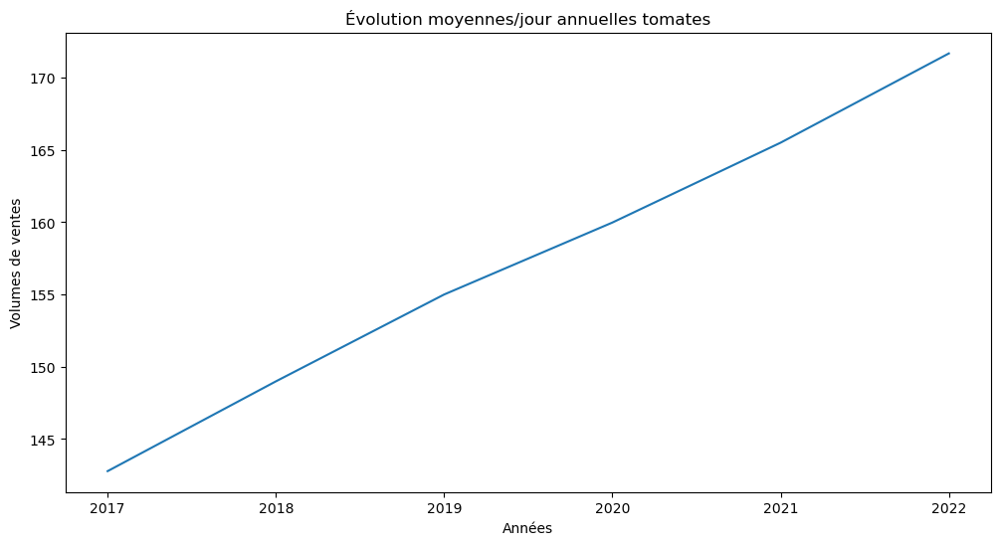

In [94]:
tomates5 = moyennes_années_produit.loc['tomate']
tomates5.plot(x='date', y='sales', figsize =(12,6))
plt.title("Évolution moyennes/jour annuelles tomates")
plt.xlabel("Années")
plt.ylabel("Volumes de ventes")
plt.show()

In [95]:
#les moyennes par jour annuelles nous font ressortir une croissance qui sont semble moins exponentielles qu'avec les volumes totaux (somme quantite)

# decomposition  variable saisonnalité

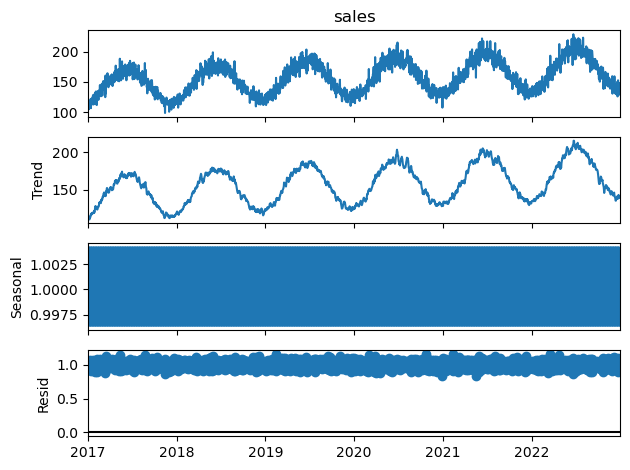

In [97]:
from statsmodels.tsa.seasonal import seasonal_decompose

test_methode1 = df_top_5.loc[df_top_5['product'] == 'tomate'].copy()

test_methode1.set_index('date', inplace=True)

decompose_variable_tomate = seasonal_decompose(test_methode1['sales'], model="multiplicative")

trend = decompose_variable_tomate.trend
seasonal = decompose_variable_tomate.seasonal
residual = decompose_variable_tomate.resid

#les graphiques s'affichent 2 fois automatiquement (environnement jupyther) je ferme le 1er graphique)
fig = decompose_variable_tomate.plot()
plt.close(fig)

#j'affiche les graphiques manuellement une seule fois

decompose_variable_tomate.plot()
plt.show()

In [98]:
# ici la tendance affine les variations vues dans les graphiques calculés précedemment

## moyenne mobile (pour applatir la représentation du jeu de donnée initial)

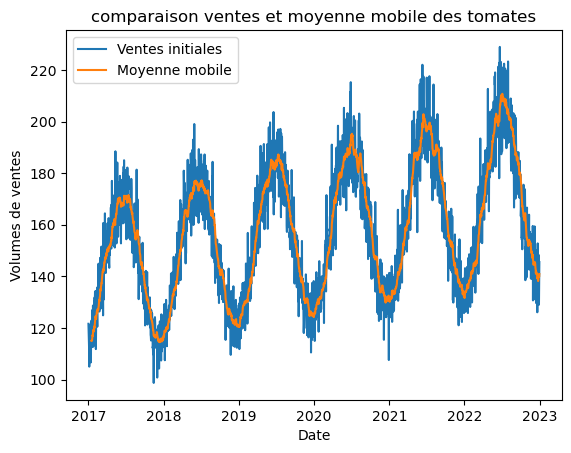

In [100]:
tomatemm = df_top_5.loc[df_top_5['product'] == 'tomate']

plt.plot(tomatemm['date'], tomatemm['sales'], label='Ventes initiales')
plt.plot(tomatemm['date'], tomatemm['sales_mm'], label='Moyenne mobile')

plt.title("comparaison ventes et moyenne mobile des tomates")
plt.xlabel("Date")
plt.ylabel("Volumes de ventes")
plt.legend()

plt.show()

In [101]:
#la moyenne mobile montre la tendance générale de la variable

### 3.2 analyse pomme

# analyse volumes sur période

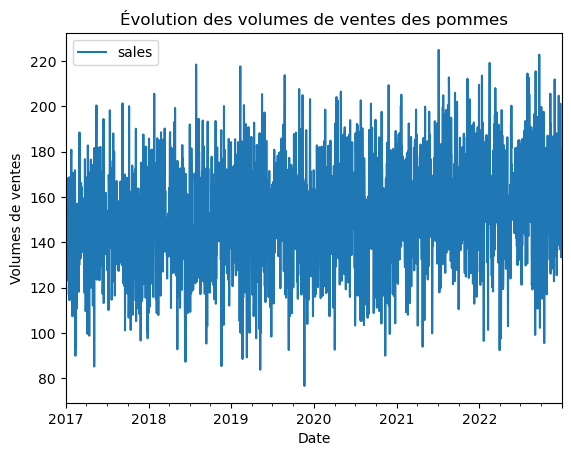

In [104]:
pommes = df_top_5.loc[df_top_5['product'] == 'pomme']
pommes.plot(x='date', y='sales')
plt.title("Évolution des volumes de ventes des pommes")
plt.xlabel("Date")
plt.ylabel("Volumes de ventes")
plt.show()

#il y a l'air d'y avoir une légère croissance générale avec beaucoup de pics constants

# analyse volumes mensuels

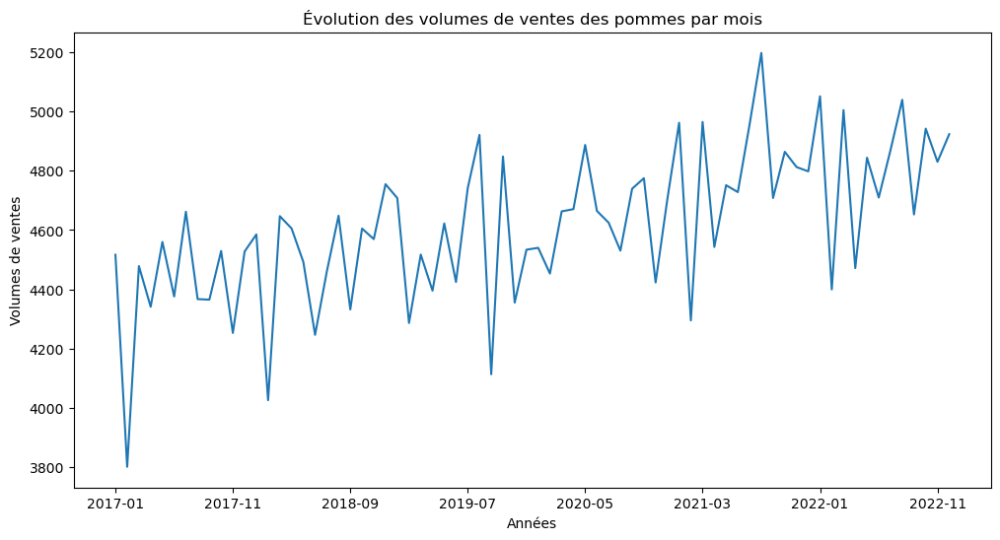

In [107]:
pommes2 = ventes_année_mois_produit.loc['pomme']
pommes2.plot(x='date', y='sales', figsize =(12,6))
plt.title("Évolution des volumes de ventes des pommes par mois")
plt.xlabel("Années")
plt.ylabel("Volumes de ventes")
plt.show()

In [108]:
# il y a comme 5 figures de variations qui reviennent

# analyse volumes annuels

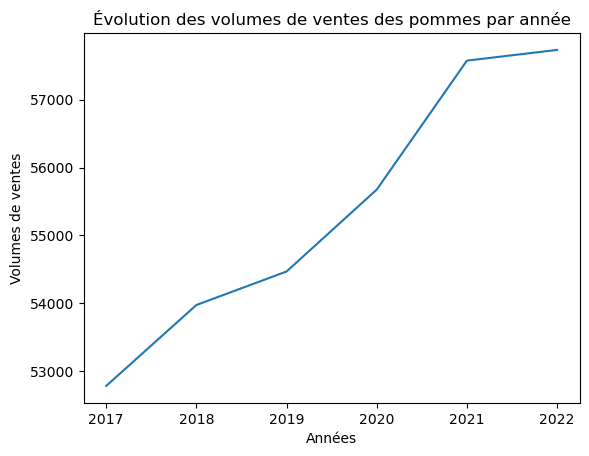

In [110]:
pommes3 = ventes_année_produit.loc['pomme']
pommes3.plot(x='date', y='sales')
plt.title("Évolution des volumes de ventes des pommes par année")
plt.xlabel("Années")
plt.ylabel("Volumes de ventes")
plt.show()

In [111]:
# avec les volumes par année on constate mieux la croissance des pommes

# analyse moyennes mensuelles

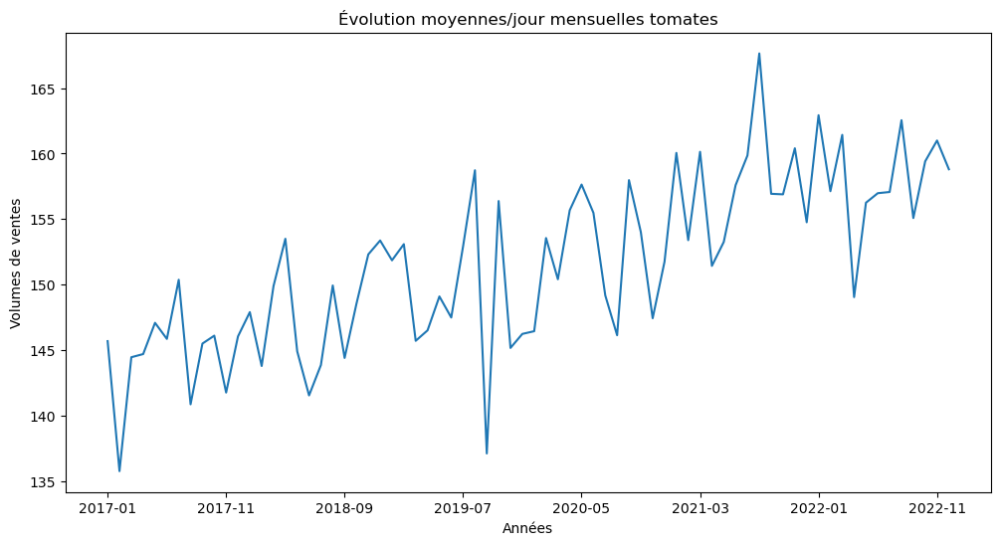

In [113]:
pommes4 = moyennes_mois_produit.loc['pomme']
pommes4.plot(x='date', y='sales', figsize =(12,6))
plt.title("Évolution moyennes/jour mensuelles tomates")
plt.xlabel("Années")
plt.ylabel("Volumes de ventes")
plt.show()

In [114]:
# on ne voit pas de grosses améliorations visuelles mais les variations semblent moins fortent

# analyse moyennes annuelles

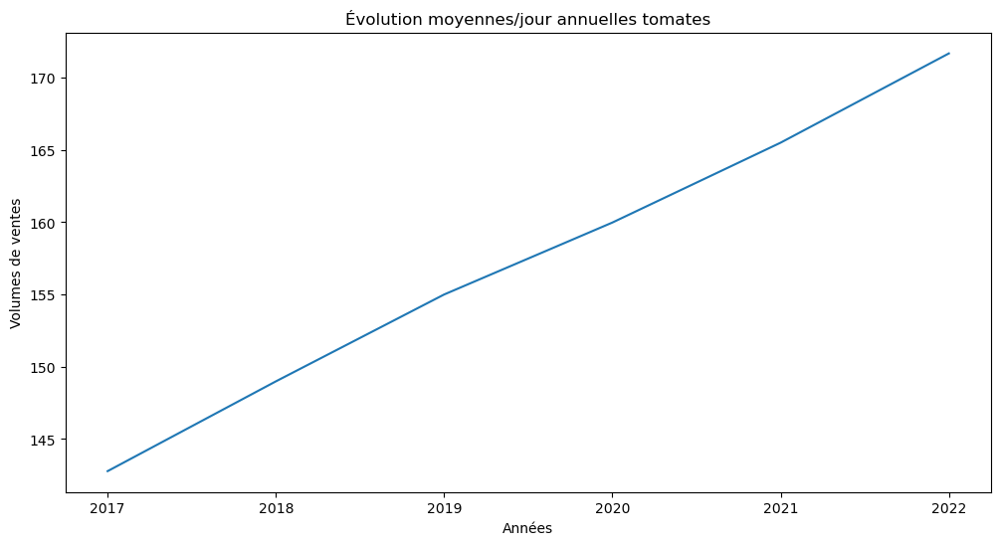

In [116]:
tomates5 = moyennes_années_produit.loc['tomate']
tomates5.plot(x='date', y='sales', figsize =(12,6))
plt.title("Évolution moyennes/jour annuelles tomates")
plt.xlabel("Années")
plt.ylabel("Volumes de ventes")
plt.show()

In [117]:
#les moyennes par jour annuelles nous font ressortir une croissance qui sont semble moins exponentielles qu'avec les volumes totaux (somme quantite)

# decomposition  variable - saisonnabilité

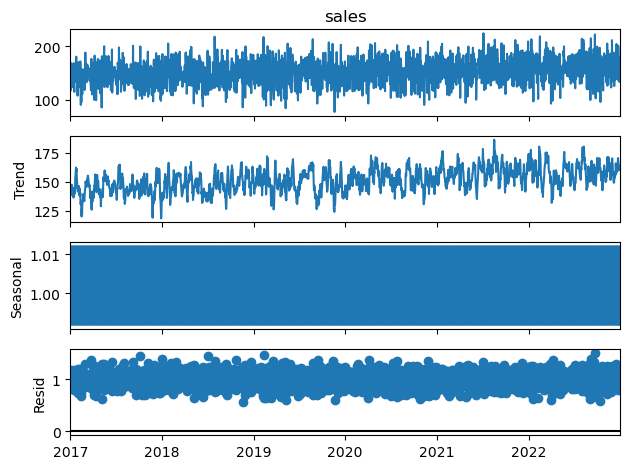

In [119]:
test_methode2 = df_top_5.loc[df_top_5['product'] == 'pomme'].copy()

test_methode2.set_index('date', inplace=True)

decompose_variable_pomme = seasonal_decompose(test_methode2['sales'], model="multiplicative")

trend = decompose_variable_pomme.trend
seasonal = decompose_variable_pomme.seasonal
residual = decompose_variable_pomme.resid

#les graphiques s'affichent 2 fois automatiquement (environnement jupyther) je ferme le 1er graphique)
fig = decompose_variable_pomme.plot()
plt.close(fig)

#j'affiche les graphiques manuellement une seule fois

decompose_variable_pomme.plot()
plt.show()

In [120]:
#le graphique tendance nous montre mieux la tendance la variable que les graphiques calculés précédemment
#la saisonnalité penche a être majoritairement supérieure à la tendance comme on le voit sur le graphique seasonal, il y a plus de valeurs entre 1.01 et 1 qque <e 1

## moyenne mobile (pour applatir la représentation du jeu de donnée initial)

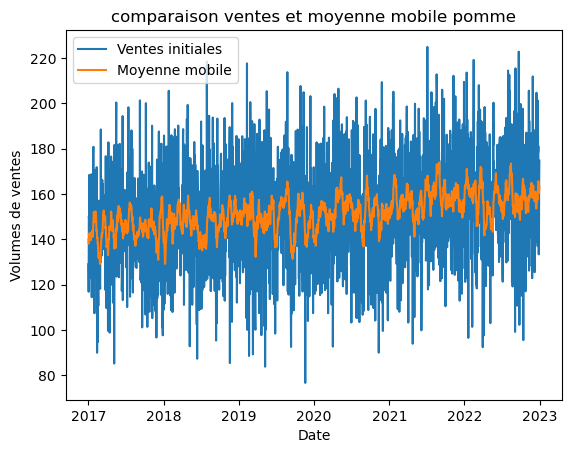

In [122]:
pommemm = df_top_5.loc[df_top_5['product'] == 'pomme']

plt.plot(pommemm['date'], pommemm['sales'], label='Ventes initiales')
plt.plot(pommemm['date'], pommemm['sales_mm'], label='Moyenne mobile')

plt.title("comparaison ventes et moyenne mobile pomme")
plt.xlabel("Date")
plt.ylabel("Volumes de ventes")
plt.legend()

plt.show()

In [123]:
#la moyenne mobile montre la tendance générale de la variable

## 3.3 analyse banane

# analyse volumes sur période

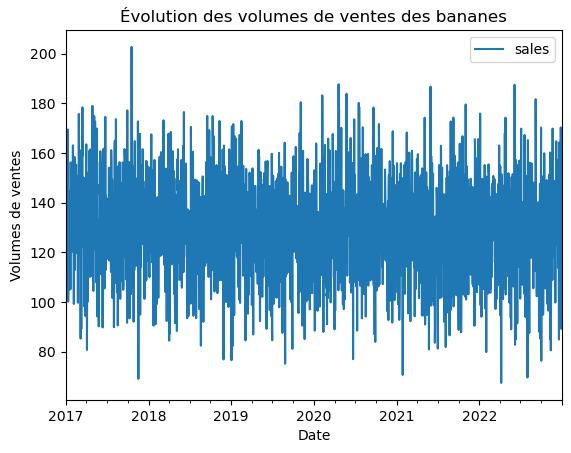

In [126]:
bananes = df_top_5.loc[df_top_5['product'] == 'banane']
bananes.plot(x='date', y='sales')
plt.title("Évolution des volumes de ventes des bananes")
plt.xlabel("Date")
plt.ylabel("Volumes de ventes")
plt.show()

In [127]:
#il y a l’air d’y avoir une légère décroissance générale avec beaucoup de pics constants

# analyse volumes mensuels

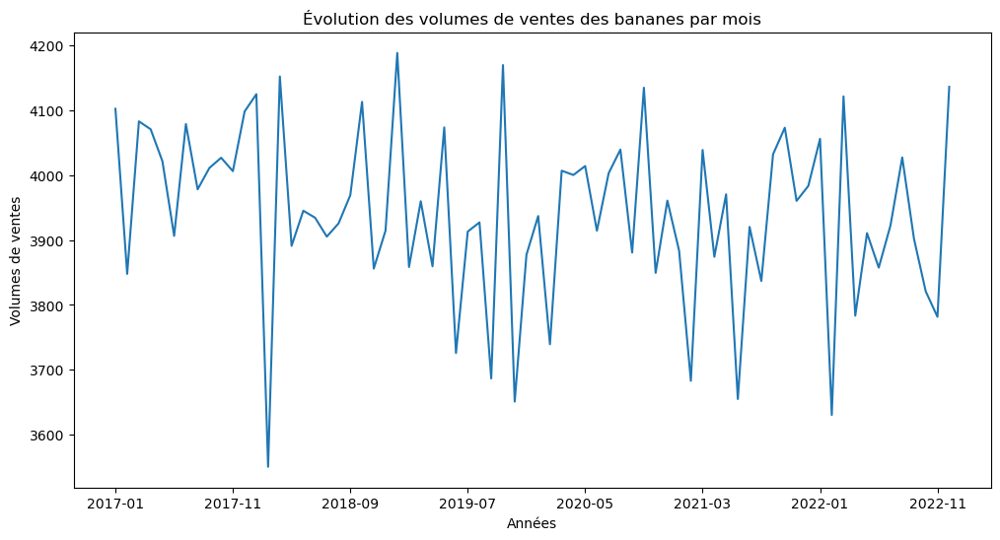

In [129]:
bananes2 = ventes_année_mois_produit.loc['banane']
bananes2.plot(x='date', y='sales', figsize =(12,6))
plt.title("Évolution des volumes de ventes des bananes par mois")
plt.xlabel("Années")
plt.ylabel("Volumes de ventes")
plt.show()

In [130]:
# la variations est difficile à décrire, beaucoup de pics

# analyse volumes annuels

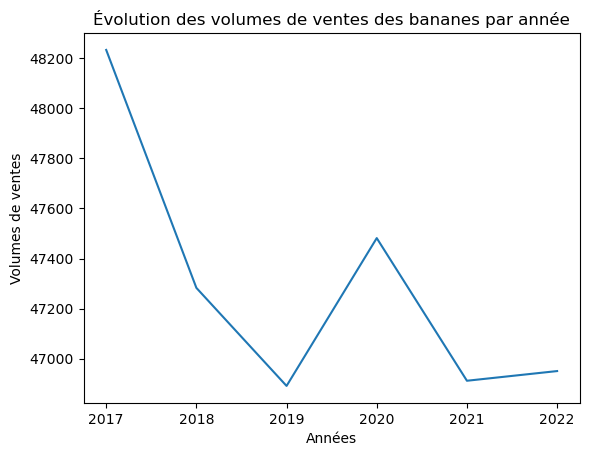

In [132]:
bananes3 = ventes_année_produit.loc['banane']
bananes3.plot(x='date', y='sales')
plt.title("Évolution des volumes de ventes des bananes par année")
plt.xlabel("Années")
plt.ylabel("Volumes de ventes")
plt.show()

In [133]:
# avec les volumes par année on constate mieux la décroissances des bananes et un léger départ en croissance qui n'a pas tenu

# analyse moyennes mensuelles

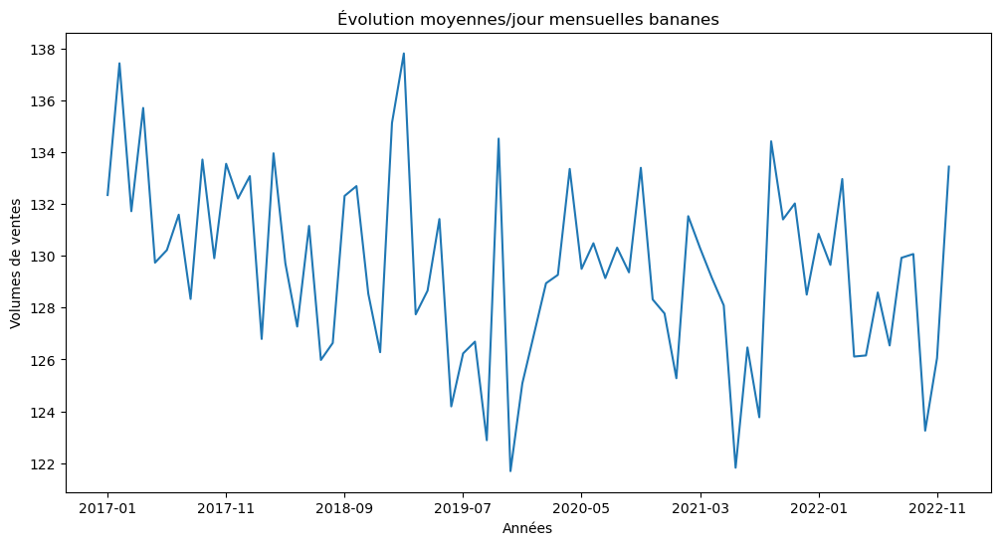

In [135]:
bananes4 = moyennes_mois_produit.loc['banane']
bananes4.plot(x='date', y='sales', figsize =(12,6))
plt.title("Évolution moyennes/jour mensuelles bananes")
plt.xlabel("Années")
plt.ylabel("Volumes de ventes")
plt.show()

In [136]:
# on ne voit pas de grosses améliorations visuelles mais les variations semblent moins fortent

# analyse moyennes annuelles

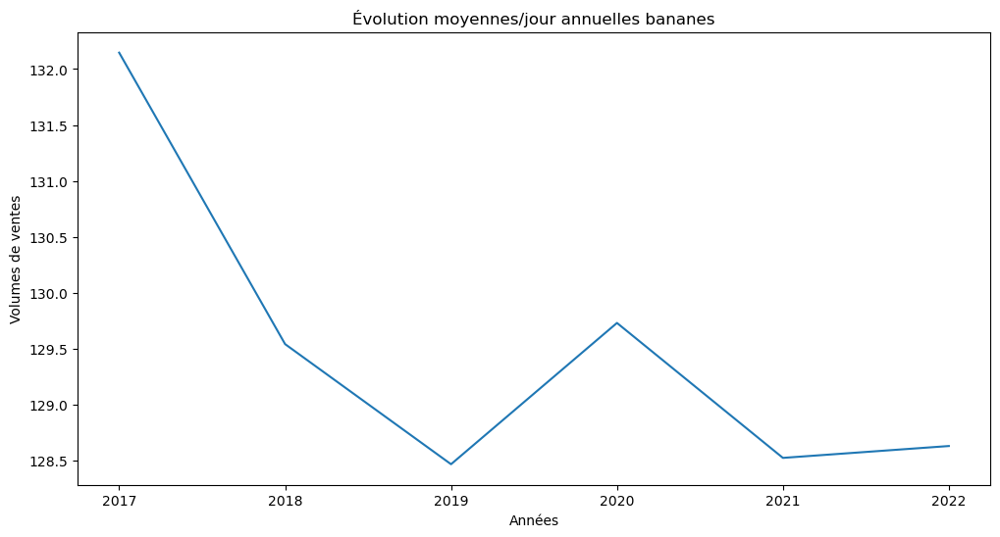

In [138]:
bananes5 = moyennes_années_produit.loc['banane']
bananes5.plot(x='date', y='sales', figsize =(12,6))
plt.title("Évolution moyennes/jour annuelles bananes")
plt.xlabel("Années")
plt.ylabel("Volumes de ventes")
plt.show()

In [139]:
#les moyennes par jour annuelles nous font ressortir la meme tendance qu'en volume globaux (somme)

# decomposition  variable

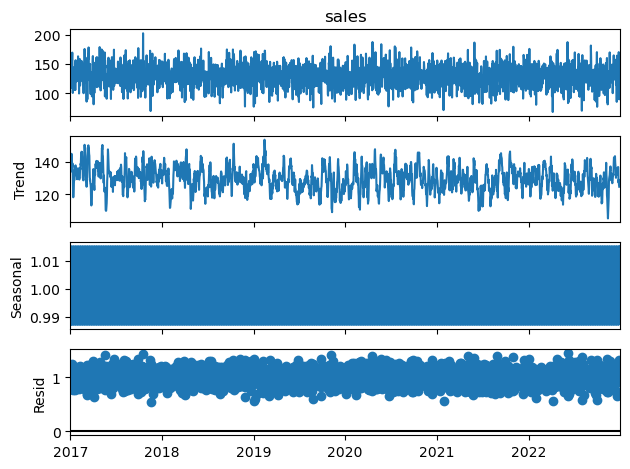

In [141]:
from statsmodels.tsa.seasonal import seasonal_decompose

test_methode3 = df_top_5.loc[df_top_5['product'] == 'banane'].copy()

test_methode3.set_index('date', inplace=True)

decompose_variable_banane = seasonal_decompose(test_methode3['sales'], model="multiplicative")

trend = decompose_variable_banane.trend
seasonal = decompose_variable_banane.seasonal
residual = decompose_variable_banane.resid

#les graphiques s'affichent 2 fois automatiquement (environnement jupyther) je ferme le 1er graphique)
fig = decompose_variable_banane.plot()
plt.close(fig)

#j'affiche les graphiques manuellement une seule fois

decompose_variable_banane.plot()
plt.show()

In [142]:
#le graphique de la tendance nous éclaire mieux sur la tendance globale de la variable par rapport aux autres graphiques
#la saisonnalité est moindre que sur les bananes (saisonabilité entre 1.1 et 0.9 donc 1%) alors que là nous sommes dans des valeurs (1.005 et 0.995) soit l/2% en positif et négatif

## moyenne mobile (pour applatir la représentation du jeu de donnée initial)

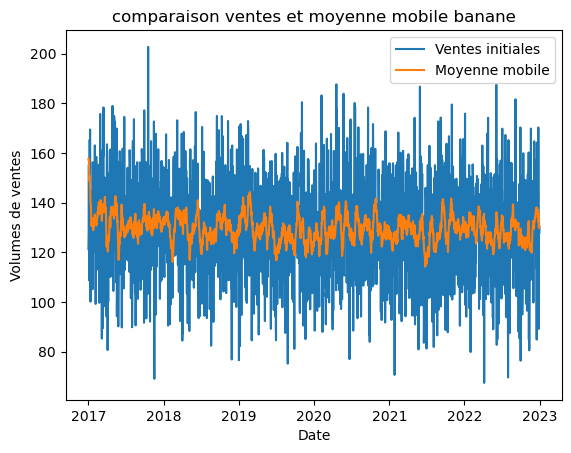

In [144]:
bananemm = df_top_5.loc[df_top_5['product'] == 'banane']

plt.plot(bananemm['date'], bananemm['sales'], label='Ventes initiales')
plt.plot(bananemm['date'], bananemm['sales_mm'], label='Moyenne mobile')

plt.title("comparaison ventes et moyenne mobile banane")
plt.xlabel("Date")
plt.ylabel("Volumes de ventes")
plt.legend()

plt.show()

In [145]:
#la moyenne mobile fait bien ressortir la tendance

## 3.4 analyse abricots

# analyse volumes sur période

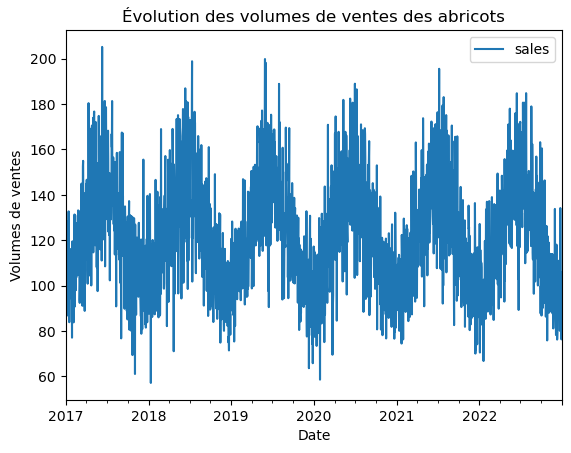

In [148]:
abricots = df_top_5.loc[df_top_5['product'] == 'abricot']
abricots.plot(x='date', y='sales')
plt.title("Évolution des volumes de ventes des abricots")
plt.xlabel("Date")
plt.ylabel("Volumes de ventes")
plt.show()

In [149]:
# la tendance a l'air constante avec des pics réguliers par année

# analyse volumes mensuels

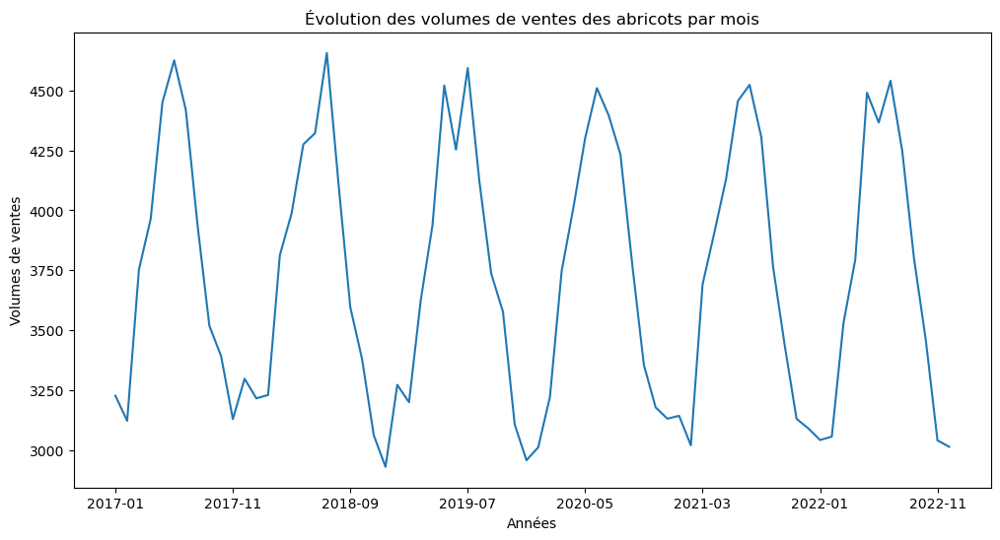

In [151]:
abricots2 = ventes_année_mois_produit.loc['abricot']
abricots2.plot(x='date', y='sales', figsize =(12,6))
plt.title("Évolution des volumes de ventes des abricots par mois")
plt.xlabel("Années")
plt.ylabel("Volumes de ventes")
plt.show()

In [152]:
# comme pour les bananes il y a des forts pics l'été 

# analyse volumes annuels

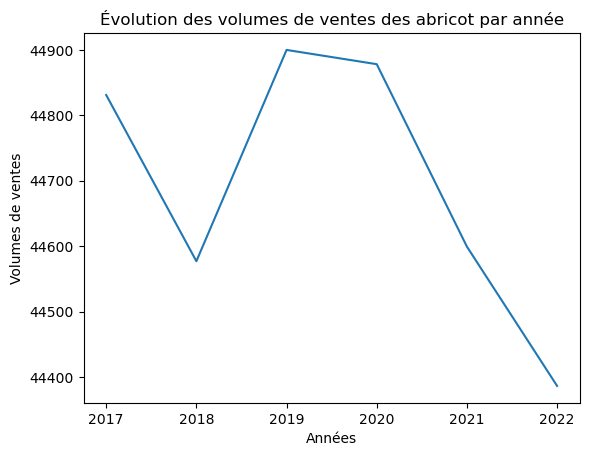

In [154]:
abricots3 = ventes_année_produit.loc['abricot']
abricots3.plot(x='date', y='sales')
plt.title("Évolution des volumes de ventes des abricot par année")
plt.xlabel("Années")
plt.ylabel("Volumes de ventes")
plt.show()

In [155]:
# avec les volumes par année on constate une décroissance depuis 2020 qui si on regarde les volume est de 5%

# analyse moyennes mensuelles

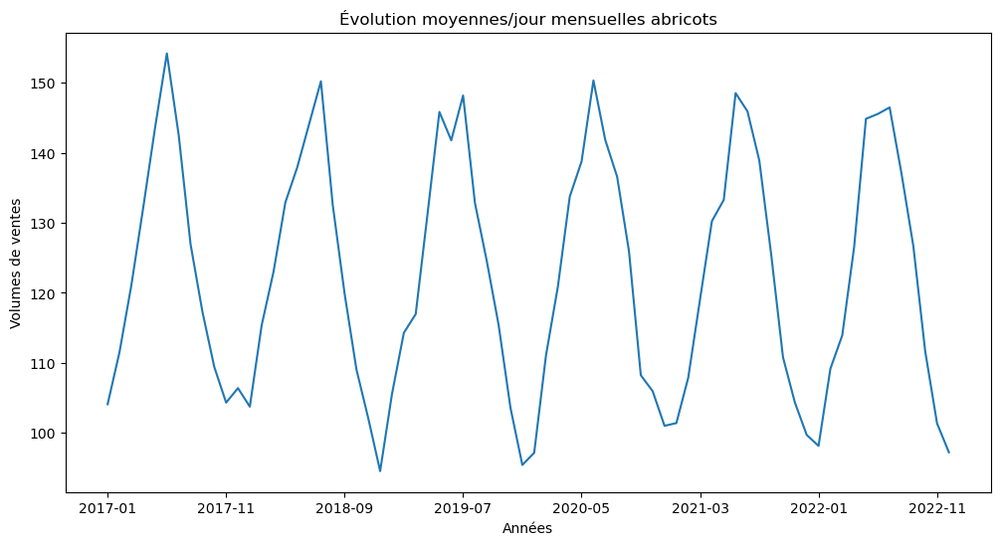

In [157]:
abricots4 = moyennes_mois_produit.loc['abricot']
abricots4.plot(x='date', y='sales', figsize =(12,6))
plt.title("Évolution moyennes/jour mensuelles abricots")
plt.xlabel("Années")
plt.ylabel("Volumes de ventes")
plt.show()

In [158]:
# on ne voit pas de grosses améliorations visuelles avec les moyennes mensuelles par rapport aux volumes globaux

# analyse moyennes annuelles

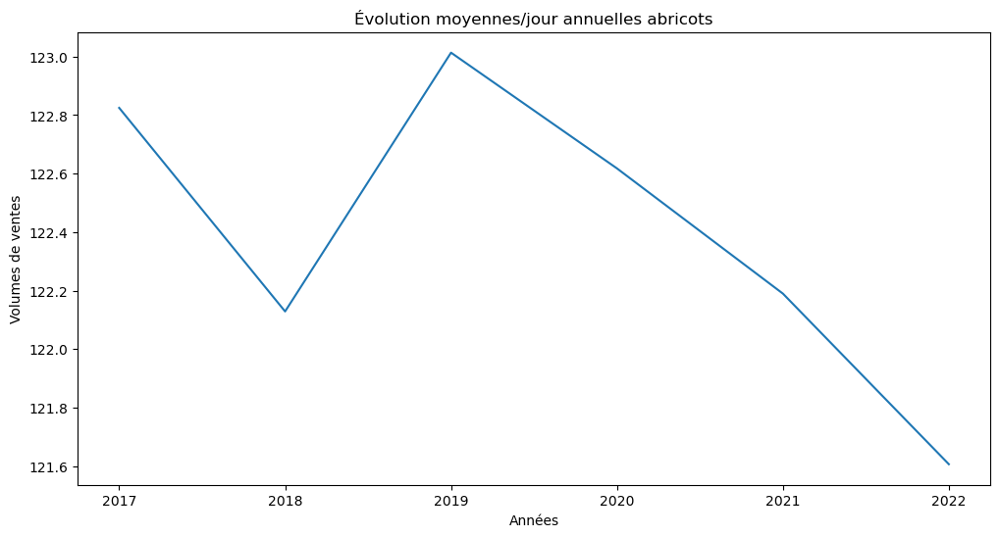

In [160]:
abricots5 = moyennes_années_produit.loc['abricot']
abricots5.plot(x='date', y='sales', figsize =(12,6))
plt.title("Évolution moyennes/jour annuelles abricots")
plt.xlabel("Années")
plt.ylabel("Volumes de ventes")
plt.show()

In [161]:
#les moyennes par jour annuelles nous font ressortir la meme tendance qu'en volume globaux (somme)

# decomposition  variable

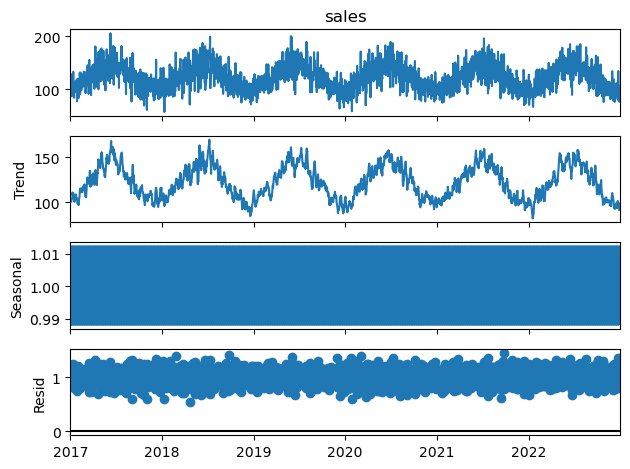

In [163]:
test_methode4 = df_top_5.loc[df_top_5['product'] == 'abricot'].copy()

test_methode4.set_index('date', inplace=True)

decompose_variable_abricot = seasonal_decompose(test_methode4['sales'], model="multiplicative")

trend = decompose_variable_abricot.trend
seasonal = decompose_variable_abricot.seasonal
residual = decompose_variable_abricot.resid

#les graphiques s'affichent 2 fois automatiquement (environnement jupyther) je ferme le 1er graphique)
fig = decompose_variable_abricot.plot()
plt.close(fig)

#j'affiche les graphiques manuellement une seule fois

decompose_variable_abricot.plot()
plt.show()

In [164]:
#les graphiques sans la décomposition nous avait déjà bien éclaires, ici la tendance montre quasiment les memes variations si ce n'est que les valeurs sont plus regroupés entre 100 et 150 unités, celà ressort mieux
#la saisonnalité est équilibrée en valeurs positives et négatives par rapport à la tendance (proportions au dessus et en dessous de 1)

## moyenne mobile (pour applatir la représentation du jeu de donnée initial)

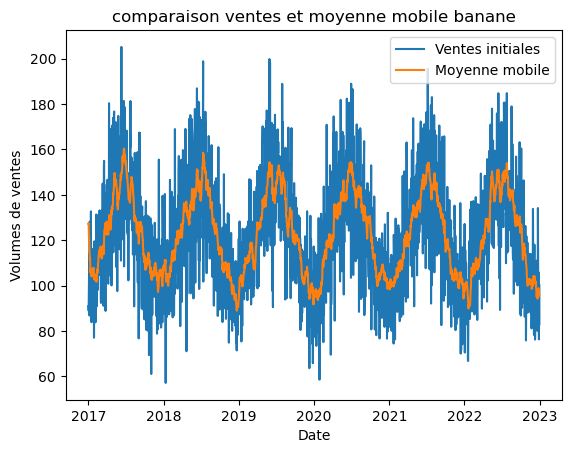

In [166]:
abricotmm = df_top_5.loc[df_top_5['product'] == 'abricot']

plt.plot(abricotmm['date'], abricotmm['sales'], label='Ventes initiales')
plt.plot(abricotmm['date'], abricotmm['sales_mm'], label='Moyenne mobile')

plt.title("comparaison ventes et moyenne mobile banane")
plt.xlabel("Date")
plt.ylabel("Volumes de ventes")
plt.legend()

plt.show()

In [167]:
# la moyenne mobile nous fait bien ressorir la tendance de la variable

## 3.5 analyse kiwi

# analyse volumes sur période

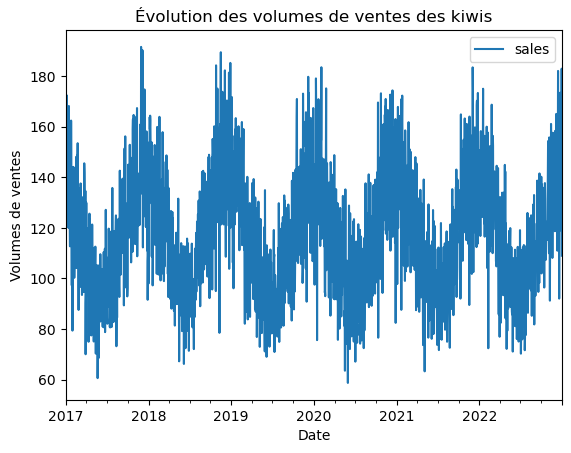

In [170]:
kiwis = df_top_5.loc[df_top_5['product'] == 'kiwi']
kiwis.plot(x='date', y='sales')
plt.title("Évolution des volumes de ventes des kiwis")
plt.xlabel("Date")
plt.ylabel("Volumes de ventes")
plt.show()

In [171]:
# la tendance a l'air constante avec des pics réguliers par année

# analyse volumes mensuels

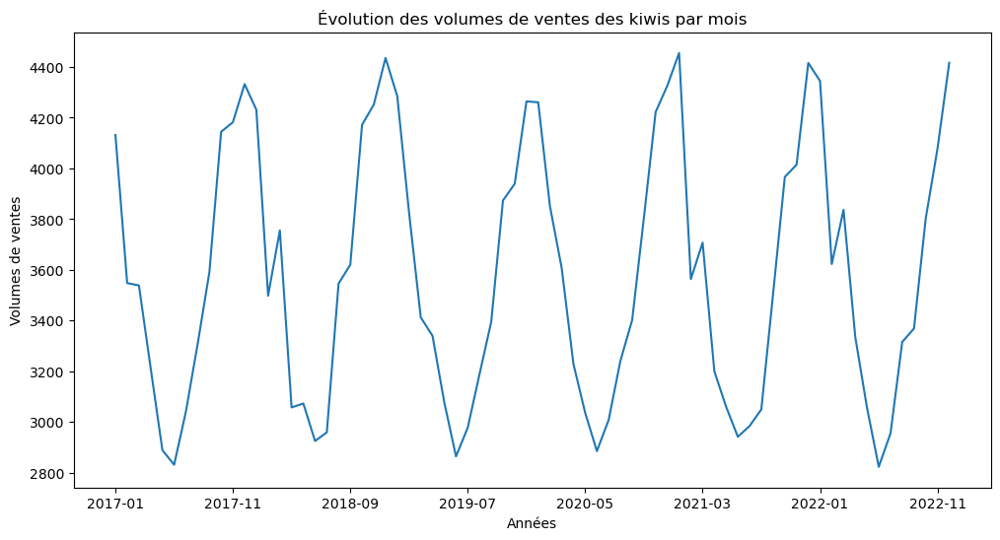

In [173]:
kiwis2 = ventes_année_mois_produit.loc['kiwi']
kiwis2.plot(x='date', y='sales', figsize =(12,6))
plt.title("Évolution des volumes de ventes des kiwis par mois")
plt.xlabel("Années")
plt.ylabel("Volumes de ventes")
plt.show()

In [174]:
# il y a des forts pics pendant l'hiver et sinon les volumes decroient de facon quasi linéaires

# analyse volumes annuels

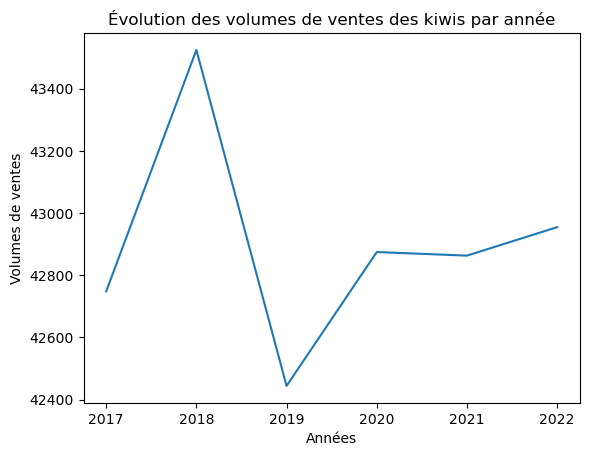

In [176]:
kiwis3 = ventes_année_produit.loc['kiwi']
kiwis3.plot(x='date', y='sales')
plt.title("Évolution des volumes de ventes des kiwis par année")
plt.xlabel("Années")
plt.ylabel("Volumes de ventes")
plt.show()

In [177]:
# avec les volumes par année on constate qu'il y a d'abord eu une période de croissance puis de décroissance qui s'est stabilisée et reste à peu prés dans les niveaux du début donc constant au global

# analyse moyennes mensuelles

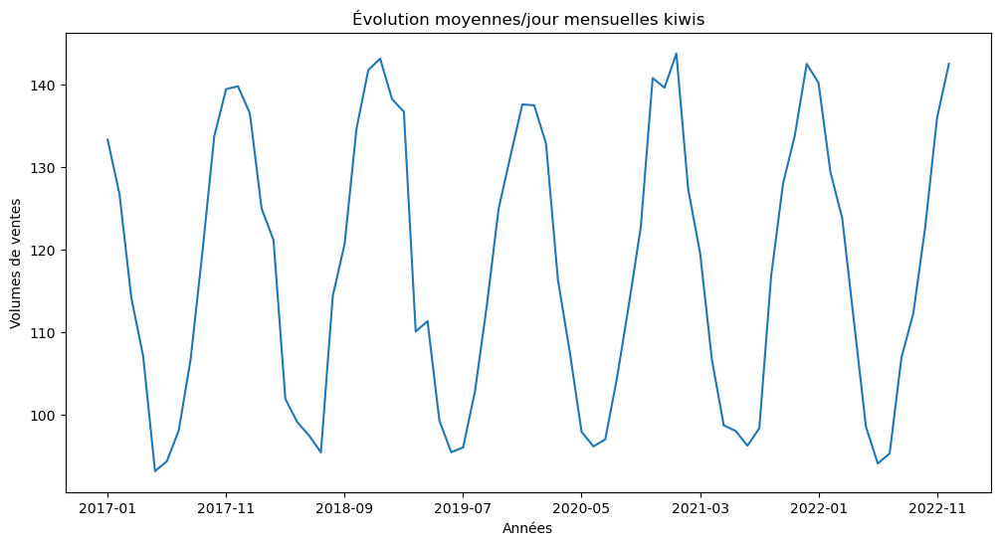

In [179]:
kiwis4 = moyennes_mois_produit.loc['kiwi']
kiwis4.plot(x='date', y='sales', figsize =(12,6))
plt.title("Évolution moyennes/jour mensuelles kiwis")
plt.xlabel("Années")
plt.ylabel("Volumes de ventes")
plt.show()

In [180]:
# on ne voit pas de grosses améliorations visuelles 

# analyse moyennes annuelles

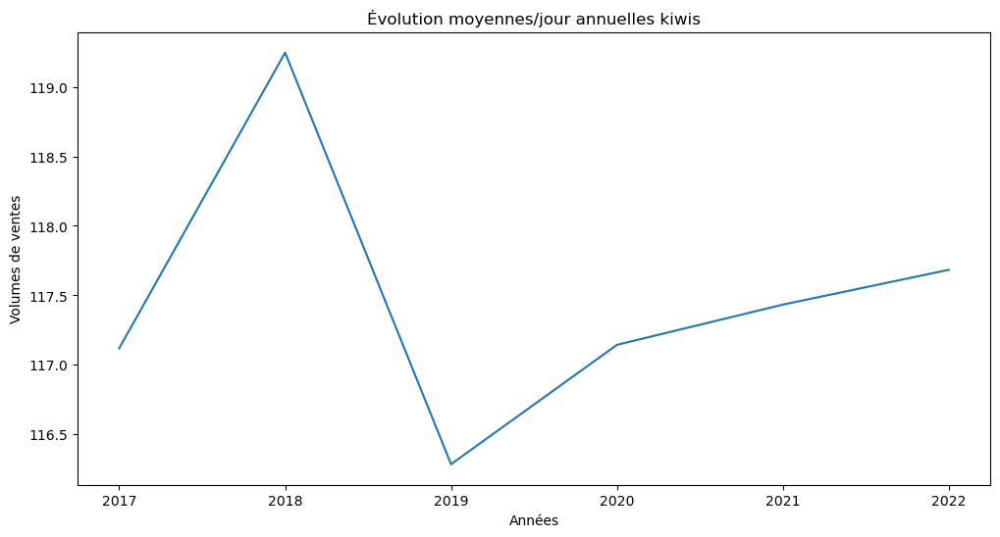

In [182]:
kiwis5 = moyennes_années_produit.loc['kiwi']
kiwis5.plot(x='date', y='sales', figsize =(12,6))
plt.title("Évolution moyennes/jour annuelles kiwis")
plt.xlabel("Années")
plt.ylabel("Volumes de ventes")
plt.show()

In [183]:
#les moyennes par jour annuelles nous font ressortir la meme tendance qu'en volume globaux (somme)

# decomposition  variable

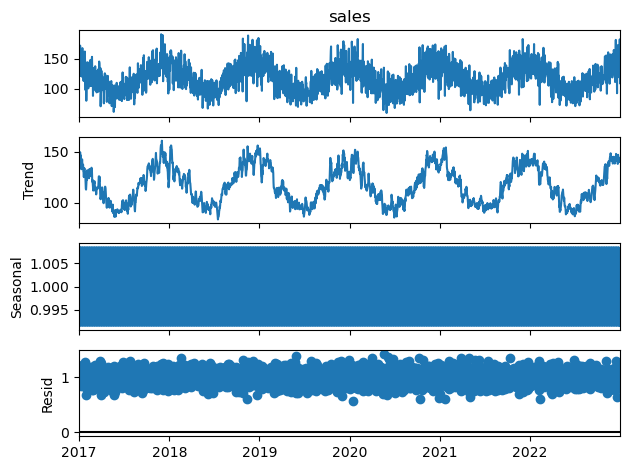

In [185]:
test_methode5 = df_top_5.loc[df_top_5['product'] == 'kiwi'].copy()

test_methode5.set_index('date', inplace=True)

decompose_variable_kiwi = seasonal_decompose(test_methode5['sales'], model="multiplicative")

trend = decompose_variable_kiwi.trend
seasonal = decompose_variable_kiwi.seasonal
residual = decompose_variable_kiwi.resid

#les graphiques s'affichent 2 fois automatiquement (environnement jupyther) je ferme le 1er graphique)
fig = decompose_variable_kiwi.plot()
plt.close(fig)

#j'affiche les graphiques manuellement une seule fois

decompose_variable_kiwi.plot()
plt.show()

In [186]:
#la tendance correspond à notre graphique avec les moyennes
#la saisonnabilité est équilibrée en proportions de la valeurs positives(>1) et négatives (<1)

## moyenne mobile (pour applatir la représentation du jeu de donnée initial)

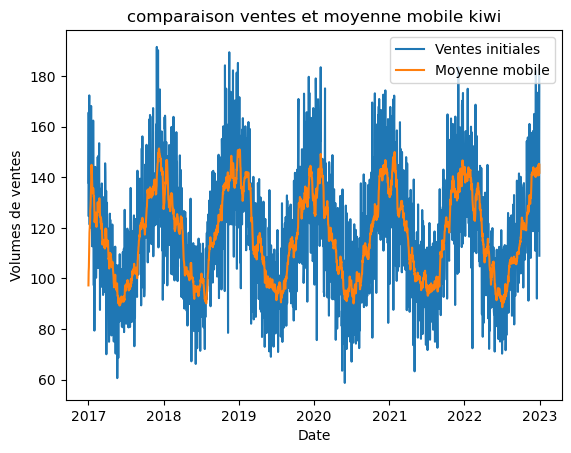

In [188]:
kiwimm = df_top_5.loc[df_top_5['product'] == 'kiwi']

plt.plot(kiwimm['date'], kiwimm['sales'], label='Ventes initiales')
plt.plot(kiwimm['date'], kiwimm['sales_mm'], label='Moyenne mobile')

plt.title("comparaison ventes et moyenne mobile kiwi")
plt.xlabel("Date")
plt.ylabel("Volumes de ventes")
plt.legend()

plt.show()

In [189]:
# la moyenne mobile nous fait bien ressorir la tendance de la variable

# 4 Analyse comparative des produits du top5

### 4.1 comparaisons volumes période (6 années) top5

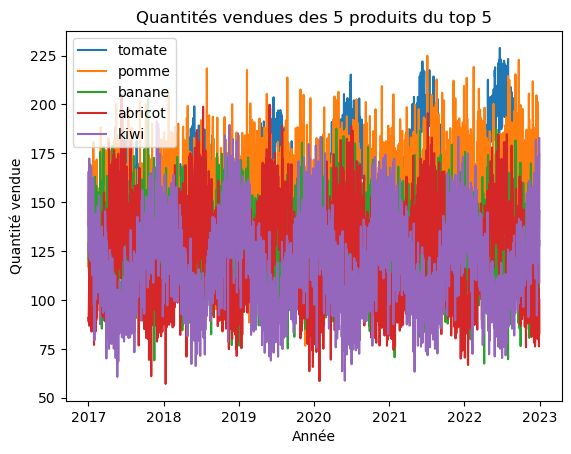

In [192]:
# il est necessaire de créer une boucle qui va créer 5 variables sur chaque produit du top 5, c'est pour ca que je fais un .unique() sur les produits dans ma boucle,
#pour chaque valeur unique produit dans le dataframe le code agrége les données dans une varible pour avoir 5 variables à comparés dans le graphique
#j'aurais également pu choisir dans la boucle la liste des produits du top 5 que j'ai déterminé en étape 2.3

fig, ax = plt.subplots()
for product in df_top_5['product'].unique():
    ventes_produit = df_top_5[df_top_5['product'] == product]
    ax.plot(ventes_produit['date'], ventes_produit['sales'], label=product)
    ax.legend()
ax.set_title("Quantités vendues des 5 produits du top 5")
ax.set_xlabel("Année")
ax.set_ylabel("Quantité vendue")
plt.show()


il y a trop de données sur l'axe des abscisses, les données sont pas lisibles, on ne voit pas de tendances

### comparaison volumes top 5 en secteur et tuyaux d'orgues

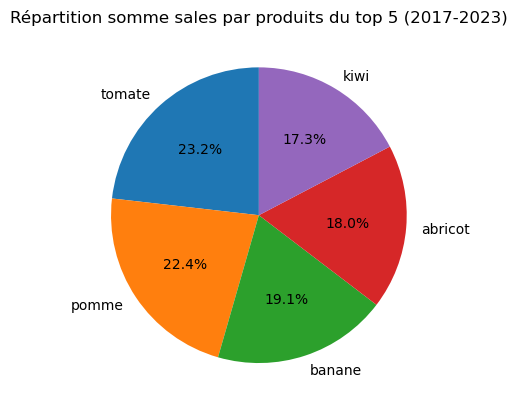

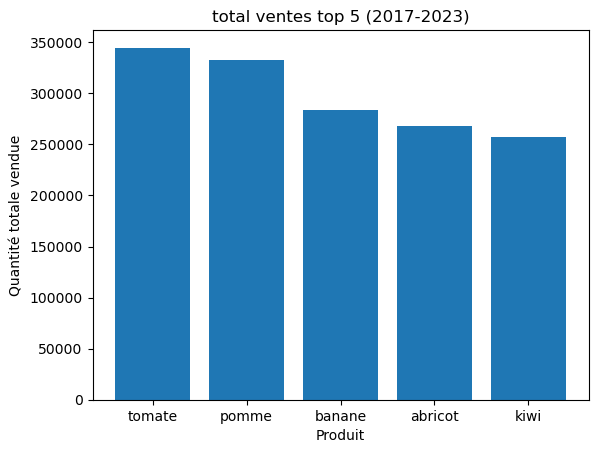

In [195]:
# je reprends la variable où j'ai calculé les sommes de chaque produits sur la période à l'étape 2.2 pour comparer en therme globaux les variables

#graphique secteur
top_5_produits = total_ventes_par_produit.head(5)

fig, ax = plt.subplots()
ax.pie(top_5_produits, labels=top_5_produits.index, autopct='%1.1f%%', startangle=90)
ax.set_title("Répartition somme sales par produits du top 5 (2017-2023)")
plt.show()

#graphique tuyaux d'orgues

fig, ax = plt.subplots()
ax.bar(top_5_produits.index, top_5_produits)
ax.set_title("total ventes top 5 (2017-2023)")
ax.set_xlabel("Produit")
ax.set_ylabel("Quantité totale vendue")
plt.show()



In [196]:
#on voit mieux la réprésentation en volume des articles du top5

### comparaison répartition volumes top 5 en boite à moustaches

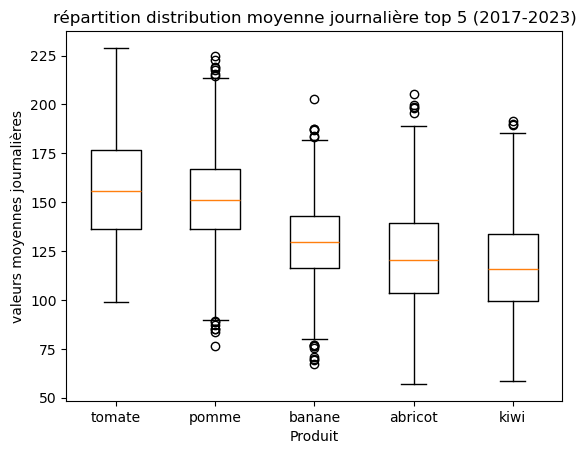

In [198]:
fig, ax = plt.subplots()

boxplot_data = []

for product in df_top_5['product'].unique():
    ventes_produit = df_top_5[df_top_5['product'] == product]['sales']
    boxplot_data.append(ventes_produit)

ax.boxplot(boxplot_data, labels=df_top_5['product'].unique())
ax.set_title("répartition distribution moyenne journalière top 5 (2017-2023)")
ax.set_xlabel("Produit")
ax.set_ylabel("valeurs moyennes journalières")
plt.show()


In [199]:
# on voit que les valeurs centrales de chaques variables sont plutot éloignées, pas d'outlieers pour les tomates, correlation proche entre tomate et pomme ainsi que banane et abricot, léger décrochage kiwi

In [200]:
#sous plotly express pour que se soit interactif pour les valeurs

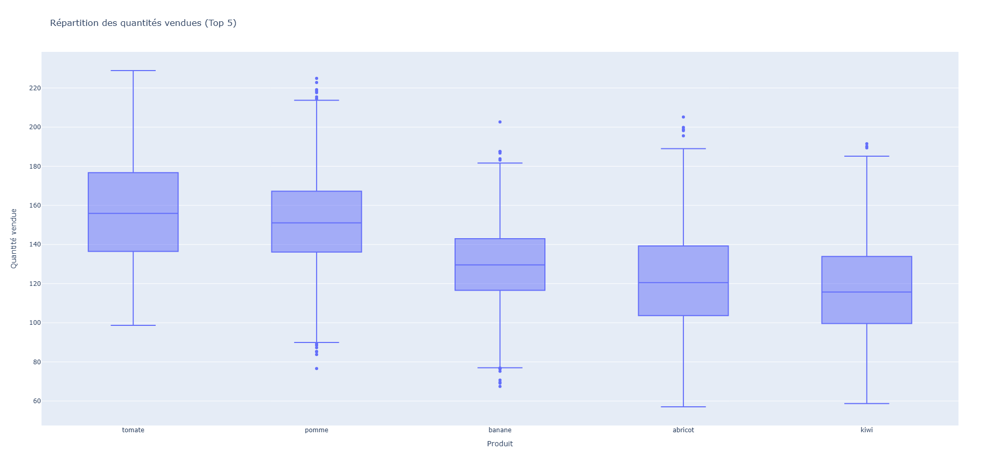

In [201]:
fig = px.box(df_top_5, x='product', y='sales', title="Répartition des quantités vendues (Top 5)", labels={'product': 'Produit', 'sales': 'Quantité vendue'})
fig.update_layout(width=600, height=900)
fig.show()

## 4.2 comparaisons annuelles top5

### 4.2.1 comparaison quantités  totales annuelles 

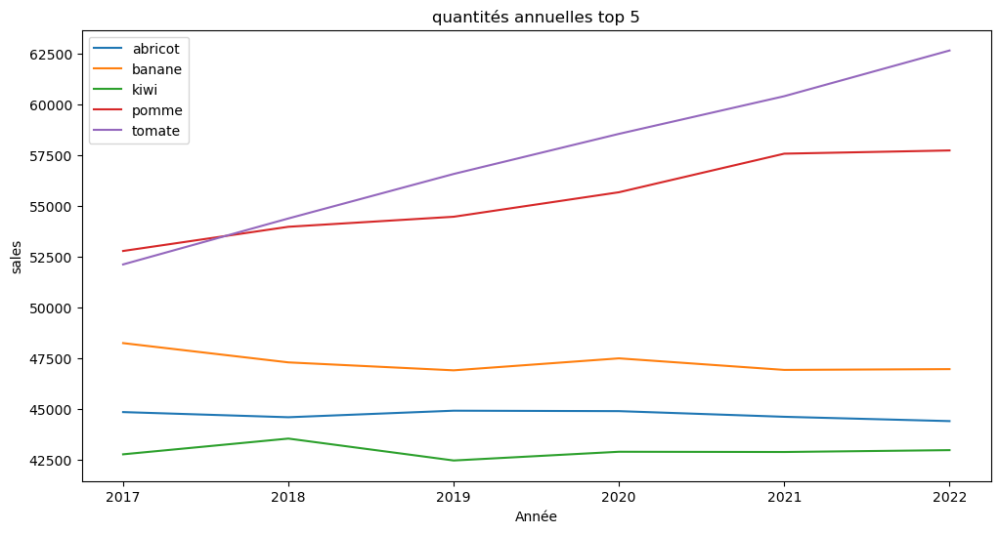

In [204]:
# Créer une figure et un axe (subplot)
fig, ax = plt.subplots(figsize=(12, 6))

# Boucle sur chaque produit du top 5
for product in ventes_année_produit_df['product'].unique():
    ventes_produit = ventes_année_produit_df[ventes_année_produit_df['product'] == product]
    ax.plot(ventes_produit['date'], ventes_produit['sales'], label=product)

# Ajouter une légende
ax.legend()

# Ajouter un titre et des labels d'axe
ax.set_title("quantités annuelles top 5")
ax.set_xlabel("Année")
ax.set_ylabel("sales")

# Afficher le graphique
plt.show()

In [205]:
#on peut considérés que la correlation entre les tomates est les pommes sont assez significatives et envisagées un regroupemt de stockage pour ces 2 produits, meme si il y a des varations et volumes un peu différent
#çà sera déjà une excellente base opérationnelle pour l'entrepot et le stockage

#le meme bilan pour les banaes, abricots, et kiwi

In [206]:
# en évolution quantitatives sur la période
#les tomates ont une évolution croissante quasi linéaire + 10.000 produits sur la période
#les pommes ont également une bonne évolution croissante moins linéaire et avec une stagnation à partir de 2021 +5.000 produits sur la période
#les bananes ont une évolution décroissante avec quelques variations et -1500 produits sur la période
#les abricots ont une évolution presque constante
#les kiwi ont une évolution presque constante avec une croissance légère au départ suivi d'une décroissance et d'une lège croissance revenue constante


### 4.2.2 comparaison moyenne/jour annuelles

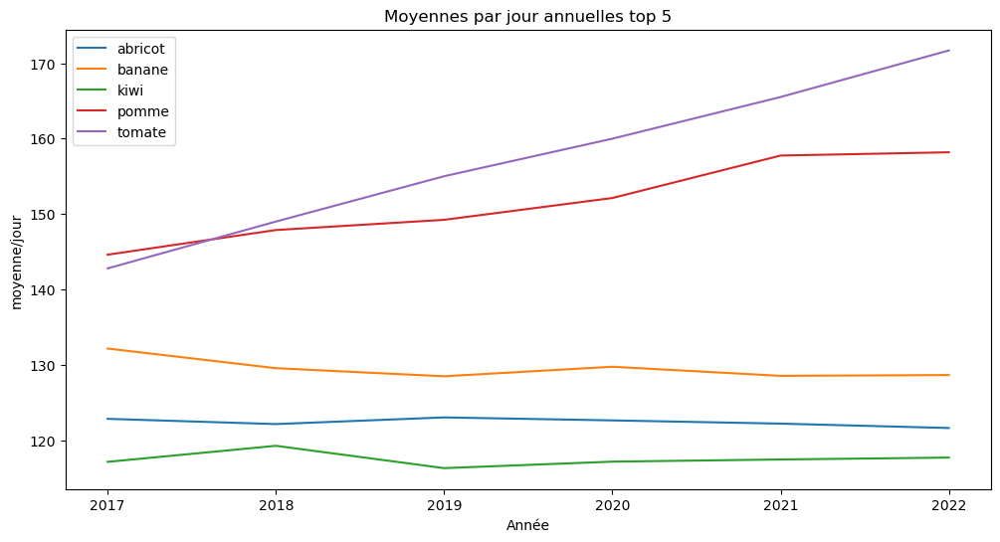

In [208]:
# Créer une figure et un axe (subplot)
fig, ax = plt.subplots(figsize=(12, 6))

# Boucle sur chaque produit du top 5
for product in moyennes_années_produit_df['product'].unique():
    ventes_produit2 = moyennes_années_produit_df[moyennes_années_produit_df['product'] == product]
    ax.plot(ventes_produit2['date'], ventes_produit2['moyenne'], label=product)

# Ajouter une légende
ax.legend()

# Ajouter un titre et des labels d'axe
ax.set_title("Moyennes par jour annuelles top 5")
ax.set_xlabel("Année")
ax.set_ylabel("moyenne/jour")

# Afficher le graphique
plt.show()

In [209]:
# les tendances sont similaires en moyenne par jour qu'en volumes par an, ce qui est rassurante pour le comportement des ventes et des stocks au quotidien, cà suit la meme tendancze

## 4.3 comparaisons quantités  mensuelles top 5

### 4.3.1 comparaisons mensuelles en volume de ventes par mois 

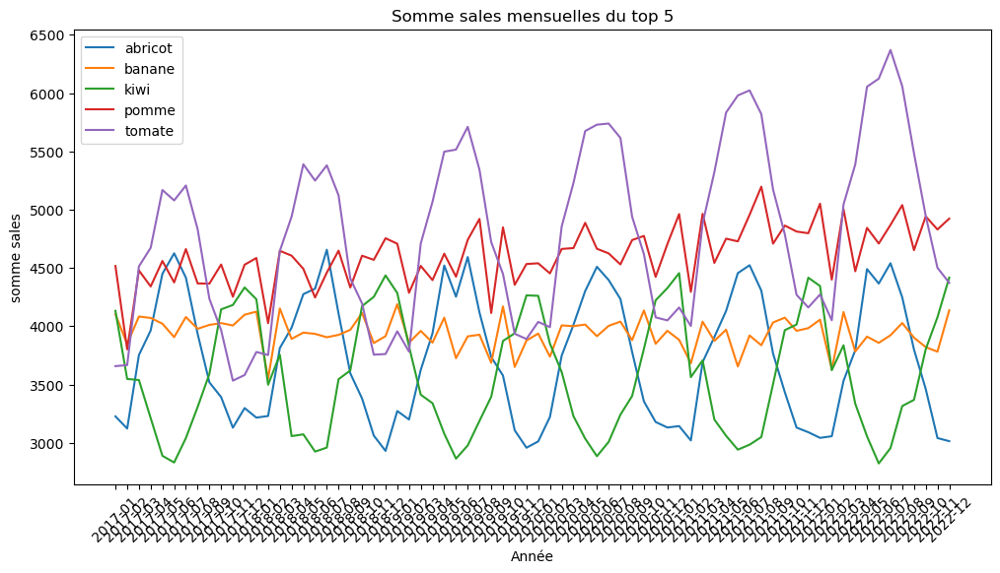

In [212]:
# Créer une figure et un axe (subplot)
fig, ax = plt.subplots(figsize=(12, 6))

# Boucle sur chaque produit du top 5
for product in ventes_année_mois_produit_df['product'].unique():
    ventes_produit3 = ventes_année_mois_produit_df[ventes_année_mois_produit_df['product'] == product]
    ax.plot(ventes_produit3['date'], ventes_produit3['sales'], label=product)

# Ajouter une légende
ax.legend()

# Ajouter un titre et des labels d'axe
ax.set_title("Somme sales mensuelles du top 5")
ax.set_xlabel("Année")
ax.set_ylabel("somme sales")

# Ajuster les labels de l'axe des abscisses pour une meilleure lisibilité
plt.xticks(rotation=45)

# Afficher le graphique
plt.show()

In [213]:
# les tendances ressortent plus difficilement quand on analyse par mois, difficile de faire ressortir les correlations à ce niveau

### 4.3.2 comparaisons mensuelles en moyennes par jour

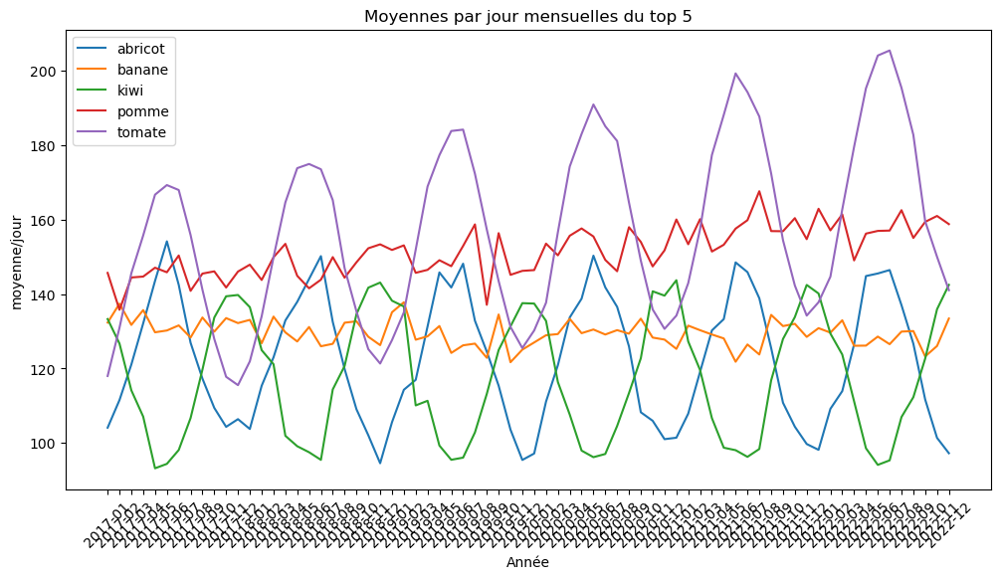

In [215]:

# Créer une figure et un axe (subplot)
fig, ax = plt.subplots(figsize=(12, 6))

# Boucle sur chaque produit du top 5
for product in moyennes_mois_produit_df['product'].unique():
    ventes_produit4 = moyennes_mois_produit_df[moyennes_mois_produit_df['product'] == product]
    ax.plot(ventes_produit4['date'], ventes_produit4['moyenne'], label=product)

# Ajouter une légende
ax.legend()

# Ajouter un titre et des labels d'axe
ax.set_title("Moyennes par jour mensuelles du top 5")
ax.set_xlabel("Année")
ax.set_ylabel("moyenne/jour")

# Ajuster les labels de l'axe des abscisses pour une meilleure lisibilité
plt.xticks(rotation=45)

# Afficher le graphique
plt.show()

In [216]:
# meme chose, les tendances ressortent plus difficilement quand on analyse par mois meme avec les moyennes par mois, difficile de faire ressorti les correlations à ce niveau, on va essayer avec la moyenne mobiles pour affiner les courbes
#il faudrait regarder en détails par mois

# analyse des volumes pour chaque mois

###en quantités vendues

In [219]:
# Conversion de la colonne 'date' en format datetime dans le dataframe
ventes_année_mois_produit_df['date'] = pd.to_datetime(ventes_année_mois_produit_df['date'], format='%Y-%m')

# Extraction du mois
ventes_année_mois_produit_df['mois'] = ventes_année_mois_produit_df['date'].dt.month

# Grouper par produit et par mois, et calculer la somme des ventes
ventes_par_mois = ventes_année_mois_produit_df.groupby(['product', 'mois'])['sales'].sum().reset_index()

print(ventes_par_mois)

    product  mois         sales
0   abricot     1  18913.265953
1   abricot     2  18851.468861
2   abricot     3  22162.406324
3   abricot     4  23602.748378
4   abricot     5  26168.534810
5   abricot     6  26531.724136
6   abricot     7  27126.251124
7   abricot     8  24947.768596
8   abricot     9  22194.553942
9   abricot    10  20601.010298
10  abricot    11  18648.941905
11  abricot    12  18423.336534
12   banane     1  24293.383753
13   banane     2  22308.444807
14   banane     3  24363.529204
15   banane     4  23479.662009
16   banane     5  23936.515501
17   banane     6  22993.250779
18   banane     7  23743.731368
19   banane     8  23735.276619
20   banane     9  23482.094937
21   banane    10  24339.693832
22   banane    11  23104.520560
23   banane    12  23971.321402
24     kiwi     1  25709.712749
25     kiwi     2  21910.158533
26     kiwi     3  21858.000011
27     kiwi     4  19373.046327
28     kiwi     5  18191.458123
29     kiwi     6  17269.816725
30     k

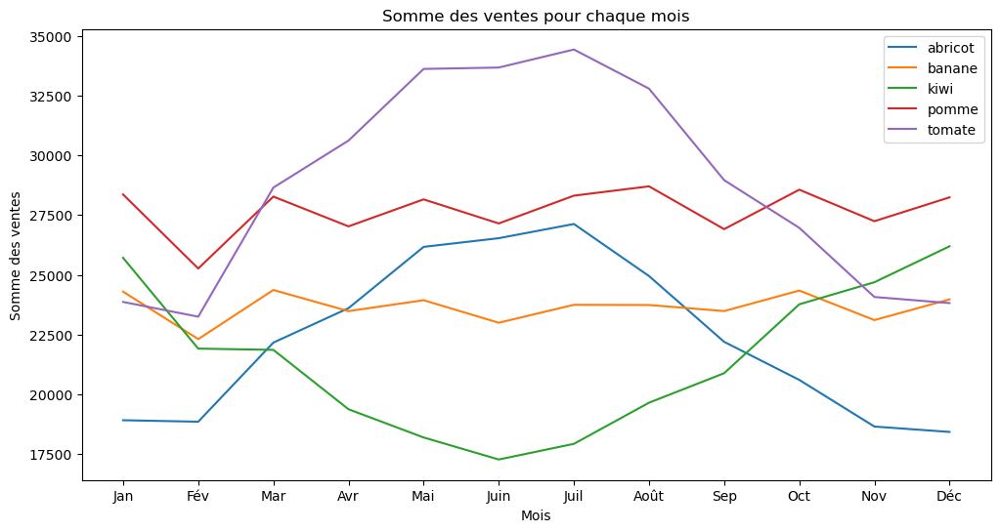

In [220]:
# Créer une figure et un axe (subplot)
fig, ax = plt.subplots(figsize=(12, 6))

# Boucle sur chaque produit pour tracer les courbes
for product in ventes_par_mois['product'].unique():
    ventes_produit_mois7 = ventes_par_mois[ventes_par_mois['product'] == product]
    ax.plot(ventes_produit_mois7['mois'], ventes_produit_mois7['sales'], label=product)

# Ajouter une légende
ax.legend()

# Ajouter un titre et des labels d'axe
ax.set_title("Somme des ventes pour chaque mois")
ax.set_xlabel("Mois")
ax.set_ylabel("Somme des ventes")

# mettre les etiquettes de l'abscisse avec le nom des mois
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Fév', 'Mar', 'Avr', 'Mai', 'Juin', 'Juil', 'Août', 'Sep', 'Oct', 'Nov', 'Déc'])
plt.show()

# grâce à cette nouvelle vision, on peut affiner le stockage des produits pendant certains mois

fortes variations des abricots et kiwi qui peuvent passer des zones de stockages fortes rotations à faibles rotations
les bananes peuvent aussir etre considérés en fortes rotations de octobre à mars

novembre-decembre-janvier-fevrier: top: pommes middle kiwi banane tomate low abricot

mars: top pomme et tomate midle kiwi abricot banane

avril-aout  top: tomate middle pomme abricot banane low kiwi

septembre-octobre: top: pomme et tomate middle abricot, banane kiwi


In [222]:
# en moyenne par jour

In [223]:
# Conversion de la colonne 'date' en format datetime dans le dataframe

moyennes_mois_produit_df['date'] = pd.to_datetime(moyennes_mois_produit_df['date'], format='%Y-%m')

# Extraction du mois
moyennes_mois_produit_df['mois'] = moyennes_mois_produit_df['date'].dt.month

# Grouper par produit et par mois, et calculer la somme des ventes
ventes_moyenne_mois = moyennes_mois_produit_df.groupby(['product', 'mois'])['moyenne'].mean().reset_index()

print(ventes_moyenne_mois)

    product  mois     moyenne
0   abricot     1  101.684226
1   abricot     2  111.549777
2   abricot     3  119.152722
3   abricot     4  131.126380
4   abricot     5  140.691047
5   abricot     6  147.398467
6   abricot     7  145.840060
7   abricot     8  134.127788
8   abricot     9  123.303077
9   abricot    10  110.758120
10  abricot    11  103.605233
11  abricot    12   99.050196
12   banane     1  130.609590
13   banane     2  132.020868
14   banane     3  130.986716
15   banane     4  130.442567
16   banane     5  128.690944
17   banane     6  127.740282
18   banane     7  127.654470
19   banane     8  127.609014
20   banane     9  130.456083
21   banane    10  130.858569
22   banane    11  128.358448
23   banane    12  128.878072
24     kiwi     1  138.224262
25     kiwi     2  129.627140
26     kiwi     3  117.516129
27     kiwi     4  107.628035
28     kiwi     5   97.803538
29     kiwi     6   95.943426
30     kiwi     7   96.365355
31     kiwi     8  105.626700
32     kiw

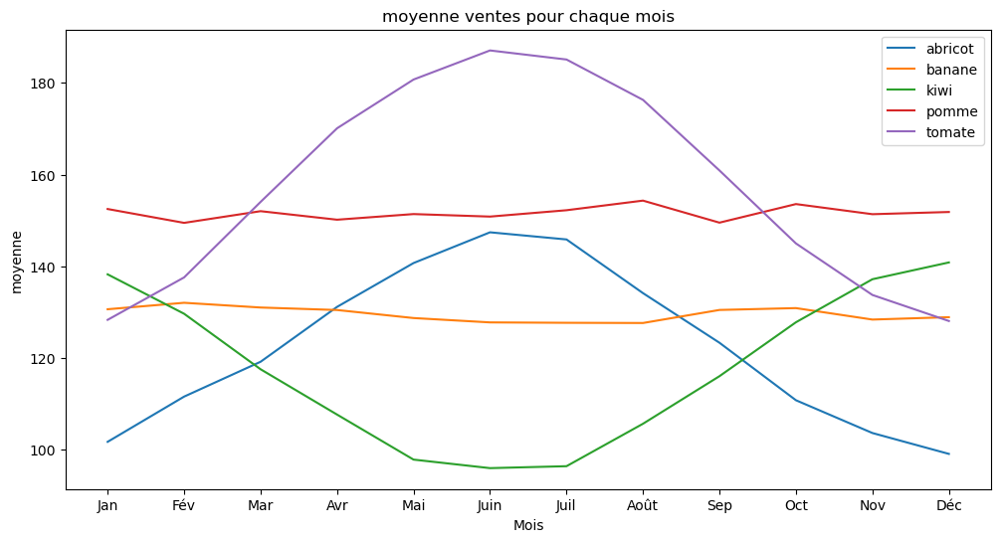

In [224]:
# Créer une figure et un axe (subplot)
fig, ax = plt.subplots(figsize=(12, 6))

# Boucle sur chaque produit pour tracer les courbes
for product in ventes_moyenne_mois['product'].unique():
    ventes_produit_mois8 = ventes_moyenne_mois[ventes_moyenne_mois['product'] == product]
    ax.plot(ventes_produit_mois8['mois'], ventes_produit_mois8['moyenne'], label=product)

# Ajouter une légende
ax.legend()

# Ajouter un titre et des labels d'axe
ax.set_title("moyenne ventes pour chaque mois")
ax.set_xlabel("Mois")
ax.set_ylabel("moyenne")

# mettre les etiquettes de l'abscisse avec le nom des mois
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Fév', 'Mar', 'Avr', 'Mai', 'Juin', 'Juil', 'Août', 'Sep', 'Oct', 'Nov', 'Déc'])
plt.show()

In [225]:
# en moyenne les variations sont atténuées mais les saisonnalités des produits restent semblables

## 4.4 comparaisons produits top 5 avec moyenne et moyenne mobile par jour

### 4.4.1 moyenne et moyenne mobile période

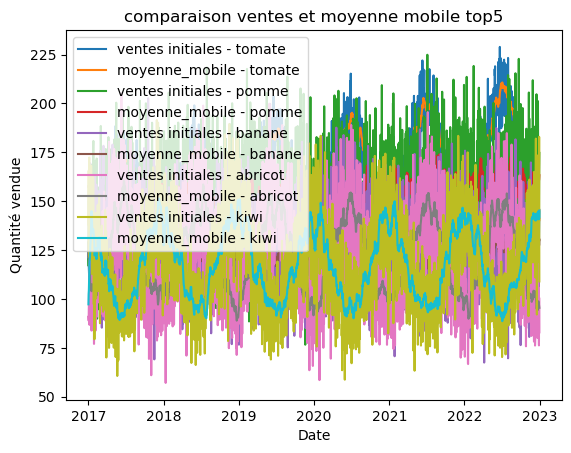

In [228]:
#creation figure graphique

fig, ax = plt.subplots()

#creation de la boucle pour créer 5 variables (1 pour chaque produit)
for product in df_top_5['product'].unique():
    df_top5mm = df_top_5[df_top_5['product'] == product]

#création des graphiques pour chaque variables/produits avec une donnée vente et une donnée moyenne mobile
    
    ax.plot(df_top5mm['date'], df_top5mm['sales'], label=f"ventes initiales - {product}")
    ax.plot(df_top5mm['date'], df_top5mm['sales_mm'], label=f"moyenne_mobile - {product}")

#parametre mise en forme graphique
    ax.legend()
ax.set_title("comparaison ventes et moyenne mobile top5")
ax.set_xlabel("Date")
ax.set_ylabel("Quantité vendue")

plt.legend()
plt.show()

In [229]:
#le graphique c'est pas lisible comme tous les graphiques que l'on a fait pour la représentation des ventes par jour sur la période, trop de données

### 4.4.2 moyenne et moyenne mobile par mois

In [231]:
#mise bon format colonnes dates dataframes

moyennes_mois_mobiles_produit_df['date'] = pd.to_datetime(moyennes_mois_mobiles_produit_df['date'])
moyennes_mois_produit_df['date'] = pd.to_datetime(moyennes_mois_produit_df['date'])

# Fusionner les dataframes moyennes_mois_mobiles_produit_df et moyennes_mois_produit
merged_df = moyennes_mois_produit_df.merge(moyennes_mois_mobiles_produit_df, on=['product', 'date'])
print(merged_df)

     product       date     moyenne  mois  moyenne_mobile
0    abricot 2017-01-01  104.095314     1      109.586545
1    abricot 2017-02-01  111.516501     2      108.251968
2    abricot 2017-03-01  121.060813     3      119.105884
3    abricot 2017-04-01  132.122552     4      129.006766
4    abricot 2017-05-01  143.542899     5      141.913455
..       ...        ...         ...   ...             ...
355   tomate 2022-08-01  195.433548     8      198.492087
356   tomate 2022-09-01  182.804299     9      184.929852
357   tomate 2022-10-01  159.571624    10      165.406209
358   tomate 2022-11-01  150.029333    11      151.553654
359   tomate 2022-12-01  141.046895    12      142.139896

[360 rows x 5 columns]


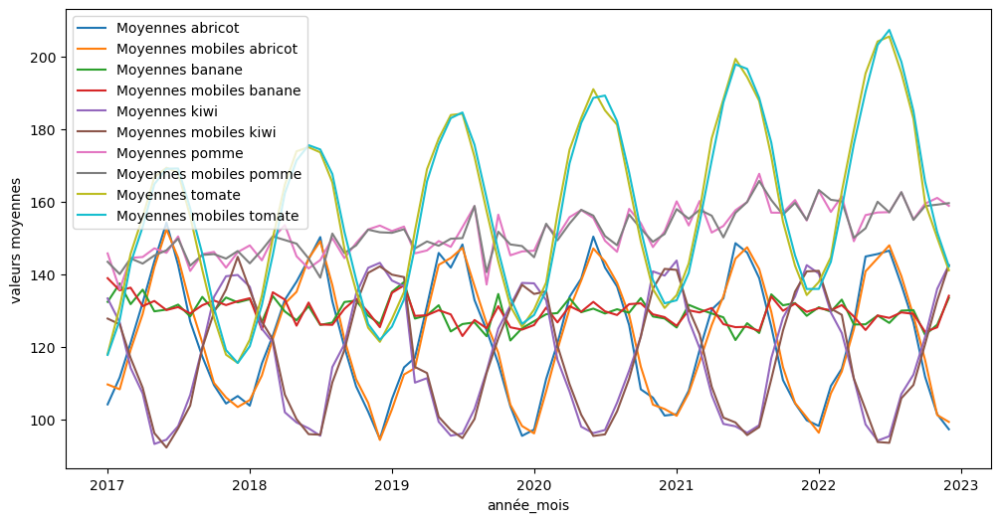

In [232]:
# Création d'une figure
fig, ax = plt.subplots(figsize=(12, 6))


# Boucle pour tracer les moyennes et les moyennes mobiles des 5 produits
for product in merged_df['product'].unique():
   # Récupération des données spécifiques au produit
   datagraphique = merged_df[merged_df['product'] == product]

   # Tracé des moyennes mensuelles
   ax.plot(datagraphique['date'], datagraphique['moyenne'], label=f'Moyennes {product}')

   # Tracé des moyennes mobiles mensuelles
   ax.plot(datagraphique['date'], datagraphique['moyenne_mobile'], label=f'Moyennes mobiles {product}')

# Configuration de l'axe des x
ax.set_xlabel('année_mois')
ax.set_ylabel('valeurs moyennes')

# Ajout de la légende
ax.legend()

# Affichage du graphique
plt.show()

In [233]:
# on voit que les moyennes mobiles atténuent les pics de variations des variables mais on distingue pas d'autres informations

### 4.4.2 moyenne et moyenne mobile par an

In [235]:
# Fusionner les dataframes moyennes_mobiles_année_df et moyennes_mois_produit

merged2_df = moyennes_années_produit_df.merge(moyennes_mobiles_année_df, on=['product', 'date'])
print(merged2_df)

    product  date     moyenne  moyenne_mobile
0   abricot  2017  122.824823      123.148229
1   abricot  2018  122.128966      122.423306
2   abricot  2019  123.013531      123.064245
3   abricot  2020  122.617856      122.514299
4   abricot  2021  122.189917      122.232410
5   abricot  2022  121.606805      121.668972
6    banane  2017  132.145943      132.716916
7    banane  2018  129.542053      129.570840
8    banane  2019  128.469129      128.643237
9    banane  2020  129.731268      129.620520
10   banane  2021  128.525712      128.502325
11   banane  2022  128.631632      128.614779
12     kiwi  2017  117.119079      116.504215
13     kiwi  2018  119.246210      118.829123
14     kiwi  2019  116.285109      116.637347
15     kiwi  2020  117.144094      117.086162
16     kiwi  2021  117.433400      117.286621
17     kiwi  2022  117.683921      117.655278
18    pomme  2017  144.595228      144.685949
19    pomme  2018  147.865917      147.474634
20    pomme  2019  149.220862     

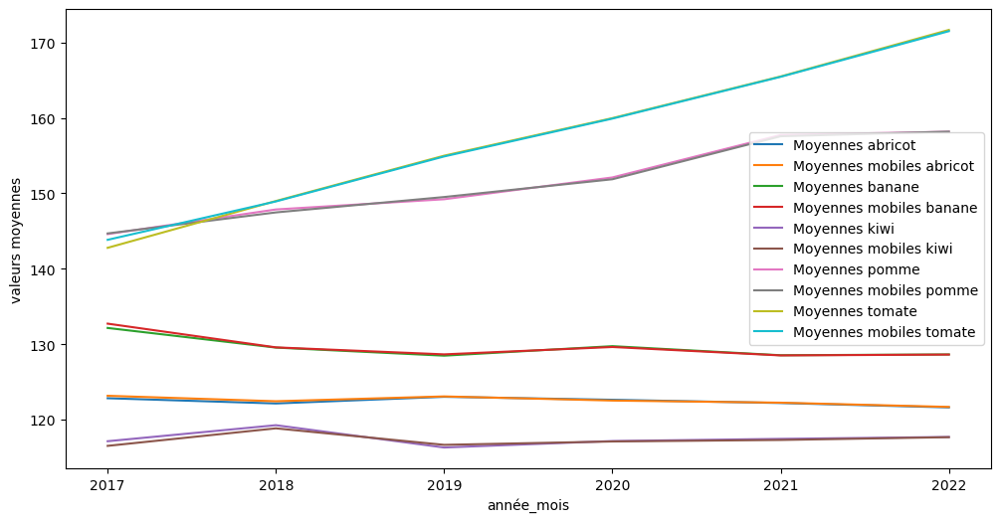

In [236]:
# Création d'une figure
fig, ax = plt.subplots(figsize=(12, 6))


# Boucle pour tracer les moyennes et les moyennes mobiles des 5 produits
for product in merged2_df['product'].unique():
   # Récupération des données spécifiques au produit
   datagraphique = merged2_df[merged2_df['product'] == product]

   # Tracé des moyennes mensuelles
   ax.plot(datagraphique['date'], datagraphique['moyenne'], label=f'Moyennes {product}')

   # Tracé des moyennes mobiles mensuelles
   ax.plot(datagraphique['date'], datagraphique['moyenne_mobile'], label=f'Moyennes mobiles {product}')

# Configuration de l'axe des x
ax.set_xlabel('année_mois')
ax.set_ylabel('valeurs moyennes')

# Ajout de la légende
ax.legend()

# Affichage du graphique
plt.show()

In [237]:
# au niveau des années on distingue des differences entre les moyennes mobiles et moyennes de 2017 et 2018 mais c'est dû au calcul de la moyenne mobile
# au niveau annuel la moyenne mobile nous apporte pas de nouvelles informations

# 5 autres outils pour voir les correlations entre les variables

## 5.1 heatmap

### heatmap ensemble période (ventes par jour)

In [241]:
df_top_5

,date,product,sales,annee,année,mois,année_mois,sales_mm
0,2017-01-01,tomate,121.629409,2017,2017,1,2017-01,NaN
1,2017-01-02,tomate,118.254860,2017,2017,1,2017-01,NaN
2,2017-01-03,tomate,115.894564,2017,2017,1,2017-01,NaN
3,2017-01-04,tomate,112.591428,2017,2017,1,2017-01,NaN
4,2017-01-05,tomate,105.016703,2017,2017,1,2017-01,NaN
...,...,...,...,...,...,...,...,...
10950,2022-12-27,kiwi,146.748839,2022,2022,12,2022-12,144.995249
10951,2022-12-28,kiwi,118.879370,2022,2022,12,2022-12,143.154661
10952,2022-12-29,kiwi,146.796827,2022,2022,12,2022-12,140.807835
10953,2022-12-30,kiwi,182.893373,2022,2022,12,2022-12,145.312436


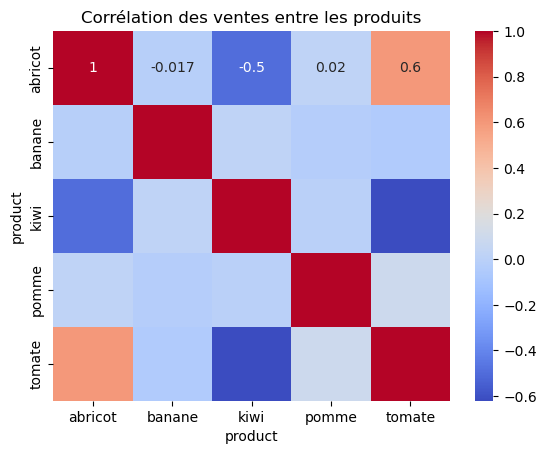

In [242]:
# Utiliser la fonction pivot pour pivoter le dataframe df_top_5 et avoir les produits en colonnes
df_pivottop5 = df_top_5.pivot(index='date', columns='product', values='sales')

# Calculer la corrélation
correlation = df_pivottop5.corr()

# Créer un heatmap pour visualiser la corrélation
sns.heatmap(correlation, annot=True, cmap='coolwarm')
plt.title("Corrélation des ventes entre les produits")
plt.show()

In [243]:
# a ce niveau les corrélations en terme de quantités ou de variations de quantités ne nous montrent pas les liens que nous avons vu précédemment

# il se dégage une corrélation moyenne entre les abricotes et les tomates, celà est dû au fait que leurs quantités varient de façon similaires sur la période meme si les quantités sont trés éloignées
# bizarrement la relation entre les bananes et les pommes qui a une variation de meme type ne ressort pas

### heatmap par annee

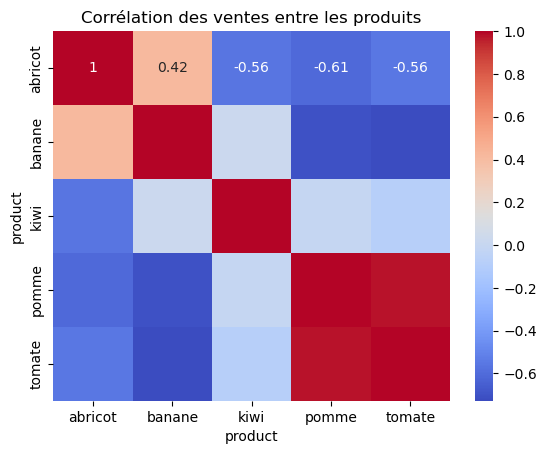

In [245]:
# Utiliser la fonction pivot pour pivoter le dataframe et avoir les produits en colonnes

df_pivotanneetop5 = ventes_année_produit_df.pivot(index='date', columns='product', values='sales')

# Calculer la corrélation
correlation = df_pivotanneetop5.corr()

# Créer un heatmap pour visualiser la corrélation
sns.heatmap(correlation, annot=True, cmap='coolwarm')
plt.title("Corrélation des ventes entre les produits")
plt.show()

In [246]:
# au niveau annuel, on retrouve bien les corrélations vu précedemment en analysant par année

# celà est dûe car on analyse d'un point de vue quantité

# forte correlation entre tomates et pommes (forte rotation)
# bonne corrélation entre banane et abricot (moyenne rotation)

### heatmap par mois

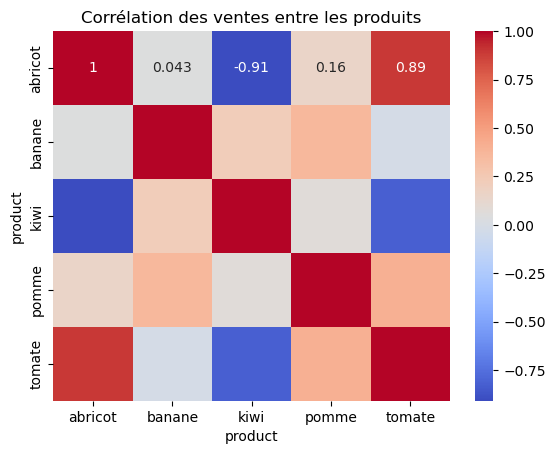

In [248]:
ventes_année_mois_produit_df

df_pivotmoistop5 = ventes_année_mois_produit_df.pivot(index='date', columns='product', values='sales')

# Calculer la corrélation
correlation = df_pivotmoistop5.corr()

# Créer un heatmap pour visualiser la corrélation
sns.heatmap(correlation, annot=True, cmap='coolwarm')
plt.title("Corrélation des ventes entre les produits")
plt.show()

In [249]:
# au niveau mensuel, on retrouve 2 types de corrélations vu précedemment en analysant par mois

#corrélations dûes aux volumes et corrélations dûes aux saisonnalités

#les corrélations sont donc changées par rapport à la vue annuelle

# corrélations de niveau moyens entre les pommes et tomates car quantités proches mais saisonnalités différentes
# forte corrélation entre les tomates et abricots qui peut paraitre incohénrence mais c'est dûe à leurs saisonnalités qui est quasiment égale meme si les volumes sont différents
# corrélations de niveau moyens entre les pommes et les bananes car saisonnalités proches mais quantités différentes
# la corrélation entre les bananes et les kiwi est à relativiser leurs saisonnalités est de memes formes mais inversées dans le temps, leurs volumes sont les moins élevés donc proches

sns.pairplot(df_top_5, hue='product')
plt.show()

## 5.2 test scatter plot

<Axes: xlabel='date', ylabel='sales'>

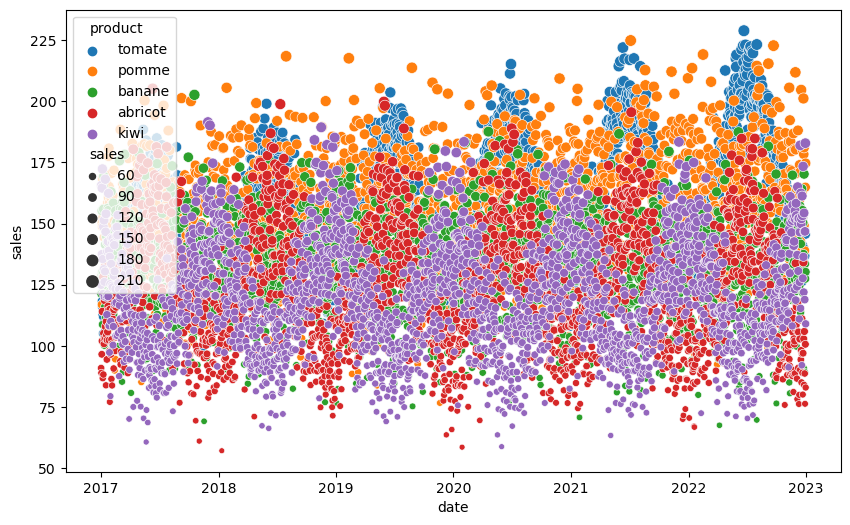

In [252]:
# Créer le scatter plot avec ajustement taille graphique, taille points en fonction valeur sales 
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_top_5, x='date', y='sales', hue='product', size="sales")


In [253]:
# on a la meme représentation qu'avec des plot classiques utilisées précédemment dans l'analyse

## 5.3 test lineplot

C:\Users\grego\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\grego\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



<Axes: xlabel='date', ylabel='sales'>

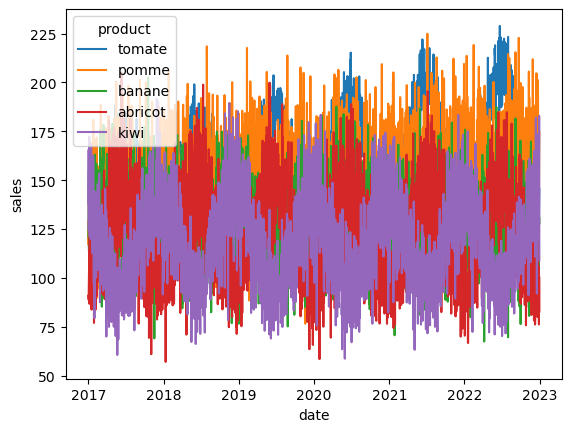

In [255]:
sns.lineplot(x='date', y='sales', hue='product', data=df_top_5)

In [256]:
# on a la meme représentation qu'avec des plot classiques utilisées précédemment dans l'analyse

## 5.4 test pairplot

In [258]:
df_pivottop5

product,abricot,banane,kiwi,pomme,tomate
date,,,,,
2017-01-01,90.861635,121.263112,124.877243,128.966949,121.629409
2017-01-02,88.881422,128.864366,165.611671,116.832421,118.254860
2017-01-03,96.503214,155.242940,137.455425,150.301339,115.894564
2017-01-04,101.933379,130.129789,164.524896,148.764290,112.591428
2017-01-05,114.014428,108.701123,172.345224,168.406868,105.016703
...,...,...,...,...,...
2022-12-27,105.855927,131.171729,146.748839,149.241608,148.337291
2022-12-28,88.641293,89.215683,118.879370,133.359511,146.873621
2022-12-29,76.243776,133.505815,146.796827,138.962728,129.023902


C:\Users\grego\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\grego\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\grego\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\grego\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\grego\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a

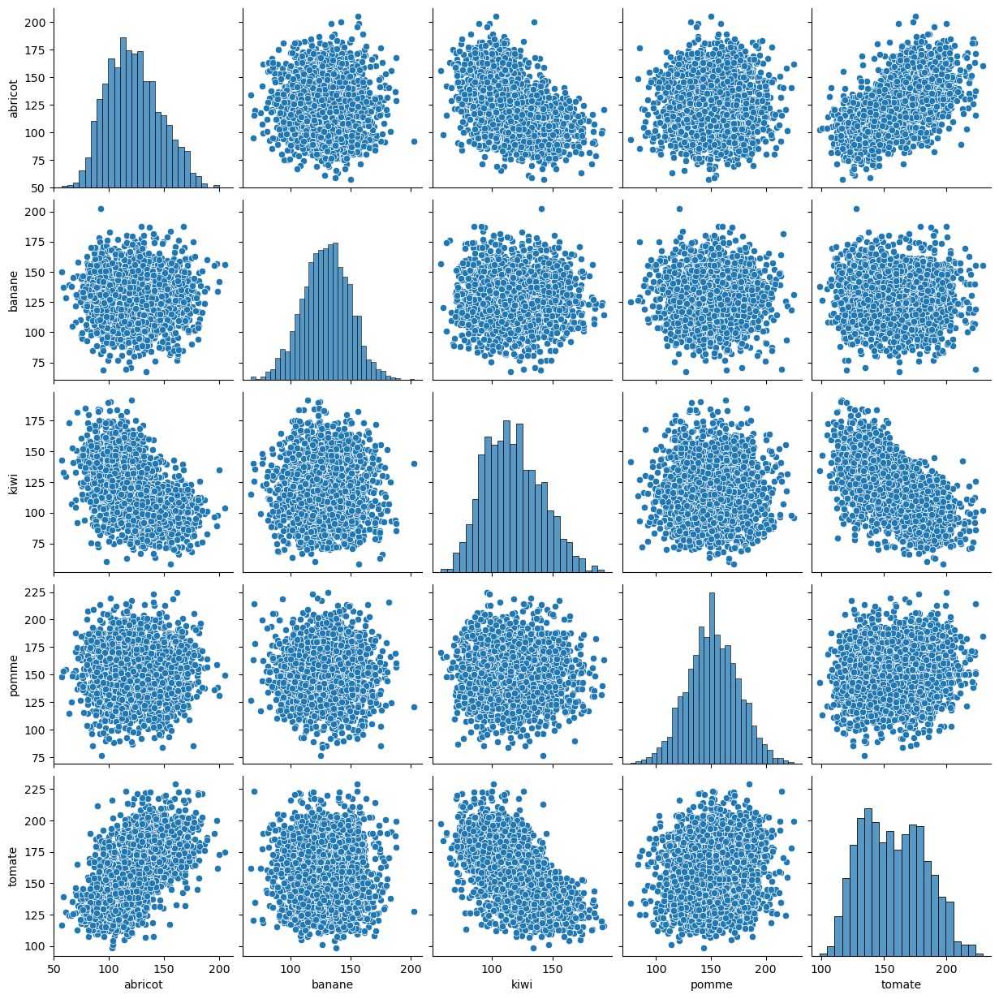

In [259]:
sns.pairplot(df_pivottop5)

In [260]:
# on voit les distributions de chaque produit avec les histogrammes et les relations entre les produits avec les nuages de points
#les nuages de points qui ont une forme pouvant faire penser à une droite croissante indique des corrélations comme les tomates et les abricots (meme saisonnalité) et les tomates et pommes dans un degré moindre (les plus forts volumes)